In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from stable_baselines3 import DQN, DDPG

from alphaQ.utils import download_ticker_data, train_test_split, plot_episodes, sharpe
from alphaQ.env import PortfolioEnv
from alphaQ.agent.features import FeatureExtractor
from alphaQ.agent.callbacks import EvalCallback
from alphaQ.agent.utils import AgentStrategy, load_model, display_attributes
from alphaQ.eval import evalu8, evaluate_baselines

import config
from config import TICKERS, MODELS, MODEL_PARAMS

warnings.filterwarnings('ignore')

rcParams = {
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'figure.figsize': (18, 9),
    'legend.fontsize': 13,
    'axes.labelsize': 14
}
plt.rcParams.update(rcParams)

### Load data

In [3]:
# load ticker and market data, split into train, validation and test sets

data = download_ticker_data(TICKERS, start=config.START, end=config.END, columns=['Open', 'High', 'Low', 'Close']).dropna()
train, val, test = train_test_split(data, train_years=10)

market = download_ticker_data('^DJI', start=config.START, end=config.END, columns=['Adj Close']).loc[data.index]
market_train, market_val, market_test = train_test_split(market, train_years=10)

[*********************100%***********************]  4 of 4 completed
[*********************100%***********************]  1 of 1 completed


In [4]:
train.shape, val.shape, test.shape

((2520, 16), (423, 16), (423, 16))

In [5]:
market_train.shape, market_val.shape, market_test.shape

((2520, 1), (423, 1), (423, 1))

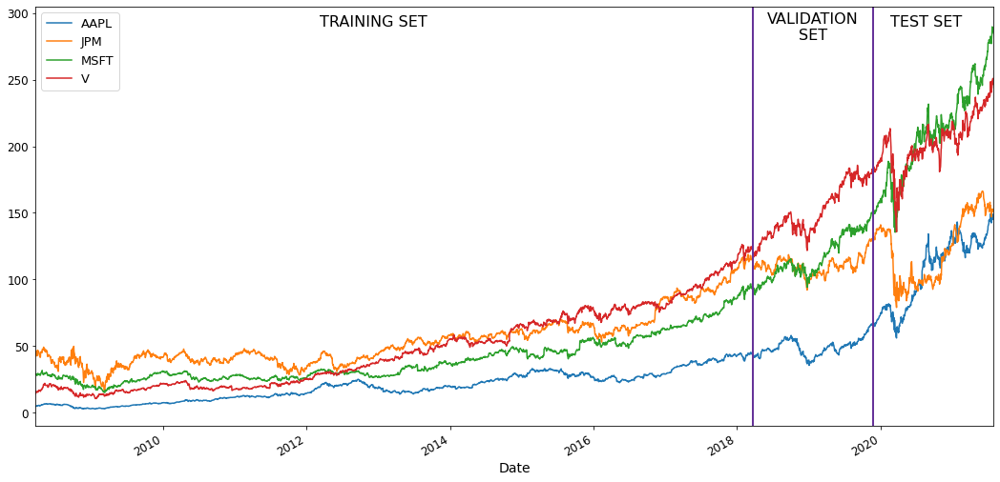

In [6]:
# plot close prices for portfolio assets
ax = data['Close'].plot()

# set axis limits
ax.set_xlim(data.index[0], data.index[-1])
ax.set_ylim(-10, 305)

# draw partition lines
plt.plot([val.index[0], val.index[0]], [-20, 1000], linewidth=2, color='rebeccapurple')
plt.plot([test.index[0], test.index[0]], [-20, 1000], linewidth=2, color='rebeccapurple')

# annotate partitions 
plt.annotate('TRAINING SET', (data.index[1000], 290), fontsize=16)
plt.annotate('VALIDATION\nSET', (data.index[2730], 280), fontsize=16, ha='center')
plt.annotate('TEST SET', (data.index[3000], 290), fontsize=16)
plt.show()

### Initialise Environment and Model

In [7]:
# 'ddpg' OR 'dqn'
model = 'ddpg' 

# retrieve action space type from config
action_space_type = config.ACTION_SPACE[model]

# set up training enviroment
env = PortfolioEnv(
    tickers=TICKERS,
    prices=train, 
    market_prices=market_train,
    window_length=config.WINDOW_LENGTH,
    trading_cost=config.COMMISSION_RATE,
    action_space_type=action_space_type,
    render=True
)

# setup validation enviroment
val_env = PortfolioEnv(
    tickers=TICKERS,
    prices=val, 
    market_prices=market_val,
    window_length=config.WINDOW_LENGTH,
    trading_cost=config.COMMISSION_RATE,
    action_space_type=action_space_type,
    render_mode='val'
)

In [8]:
# load model parameters
model_params = MODEL_PARAMS[model]
model_params

{'net_arch': [512, 256, 128],
 'multiplier': 2,
 'hyperparams': {'policy': 'MultiInputPolicy',
  'learning_rate': 2e-06,
  'learning_starts': 10000,
  'buffer_size': 10000,
  'batch_size': 64,
  'tau': 0.005,
  'gamma': 1,
  'train_freq': 100,
  'action_noise': 'ornstein_uhlenbeck'},
 'exploration': {'noise_sigma': 0.2}}

In [9]:
# set neural network params
policy_kwargs = {
    'features_extractor_class': FeatureExtractor,
    'features_extractor_kwargs': {
        'features_dim': 16 * model_params['multiplier'] * 4 + 5,
        'multiplier': model_params['multiplier']
    },
    'net_arch': model_params['net_arch'],
    'optimizer_kwargs': {
#         'weight_decay': 5e-9,  # uncomment to use ridge regularisation
    }
}

In [10]:
# load model hyperparameters
model_kwargs = dict(model_params['hyperparams'])
# add exploration params
model_kwargs.update(model_params['exploration'])

# set up action noise (for DDPG)
if 'action_noise' in model_kwargs:

    # determine dimension of action space
    n_actions = env.action_space.shape[-1]
    # extract noise sigma from params
    sigma = model_kwargs.pop('noise_sigma')

    model_kwargs['action_noise'] = config.ACTION_NOISE[model_kwargs['action_noise']](
        mean=np.zeros(n_actions), 
        sigma= sigma * np.ones(n_actions)
    )

model_kwargs.get('action_noise')

OrnsteinUhlenbeckActionNoise(mu=[0. 0. 0. 0. 0.], sigma=[0.2 0.2 0.2 0.2 0.2])

In [11]:
# instantiate model
agent = MODELS[model](
    env=env,
    policy_kwargs=policy_kwargs,
    verbose=config.TRAIN_VERBOSE_LEVEL, 
    seed=config.RANDOM_SEED,
    **model_kwargs,
)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


### Train

In [12]:
# determine episode length based on data and window length
episode_length = env.prices.shape[0] - config.WINDOW_LENGTH

if config.CALLBACK_ENABLED:
    # set up evaluation callback on validation env 
    eval_callback = EvalCallback(
        eval_env=val_env, 
        n_eval_episodes=1, 
        eval_freq=episode_length, 
        log_path=config.LOG_PATH, 
        best_model_save_path=config.SAVE_PATH, 
        verbose=config.CALLBACK_VERBOSE_LEVEL, 
        warn=False
    )
else:
    eval_callback = None

In [14]:
# set number of episodes for training
num_episodes = 80

# begin training
agent.learn(total_timesteps=num_episodes*episode_length, callback=eval_callback)

mean:
rewards         0.274011
total_wealth    2.224810
dtype: float64


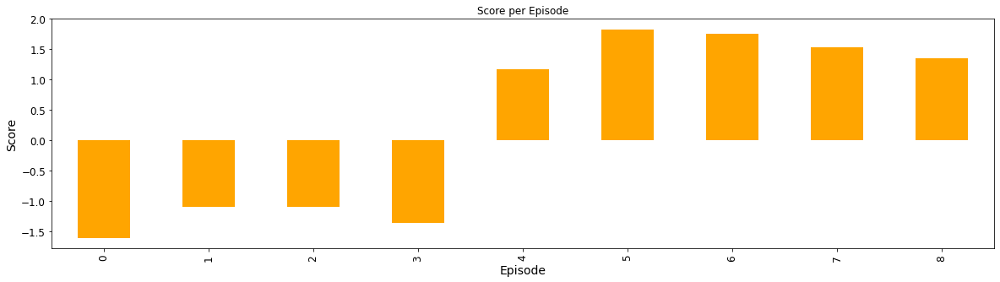

In [15]:
# plot cumulative rewards per episode
plot_episodes(env)

In [17]:
# plot progression of best models by plotting 
# episodic rewards on validation environment
plot_episodes(val_env)

### Test

In [18]:
agents = []

'''Choose only one of the following options.'''

# 1. load single agent from path
# model = 'ddpg'  # OR 'ddpg'
# print(f'Loading {model} model...')
# agents.append((model, MODELS[model].load(config.MODEL_PATH[MODEL])))

# 2. load all agents in saved paths
for model, path in config.MODEL_PATH.items():
    agents.append((model, MODELS[model].load(path)))

# 3. load all agents in directory defined in PATH
# PATH = 'models/'
# for file in os.listdir(PATH):
#     if not (file.startswith('DDPG') or file.startswith('DQN')):
#         continue
#     print(file)
#     agents.append(load_model(PATH+file))

ddpg
EPISODE: 1 Steps: 373
Total wealth: 1.5595


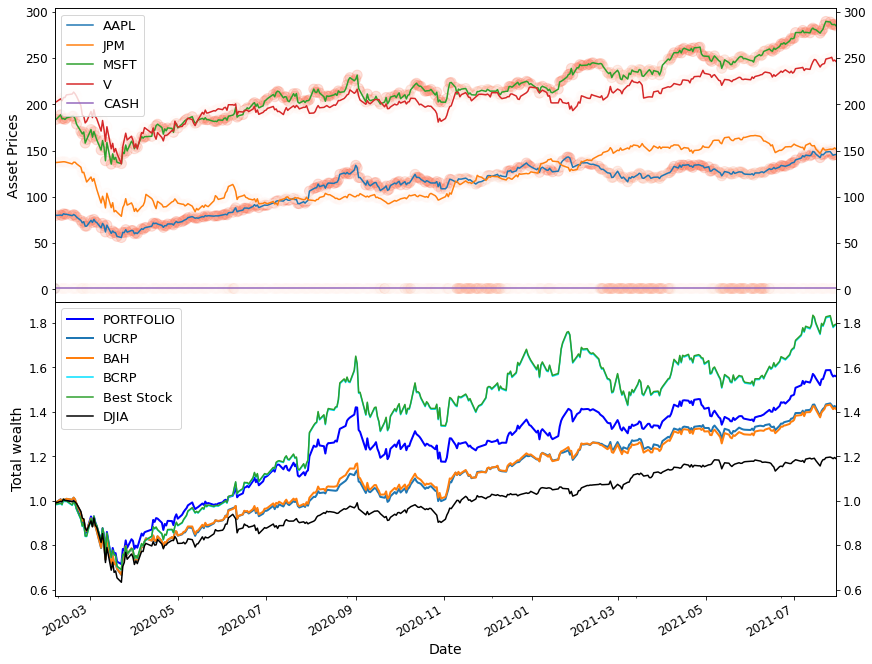

learning_rate: 2e-06
gamma: 1
batch_size: 64
buffer_size: 10000
polyak_update: 0.005
action_noise: NormalActionNoise(mu=[0. 0. 0. 0. 0.], sigma=[0.02 0.02 0.02 0.02 0.02])
feature_extractor:
Sequential(
  (0): Conv2d(4, 8, kernel_size=(1, 8), stride=(1, 1))
  (1): ReLU()
  (2): Conv2d(8, 16, kernel_size=(1, 16), stride=(1, 1))
  (3): ReLU()
  (4): Conv2d(16, 32, kernel_size=(1, 28), stride=(1, 1))
  (5): ReLU()
  (6): Flatten(start_dim=1, end_dim=-1)
)
net_arch: [512, 256, 128]

dqn
EPISODE: 1 Steps: 373
Total wealth: 1.7215


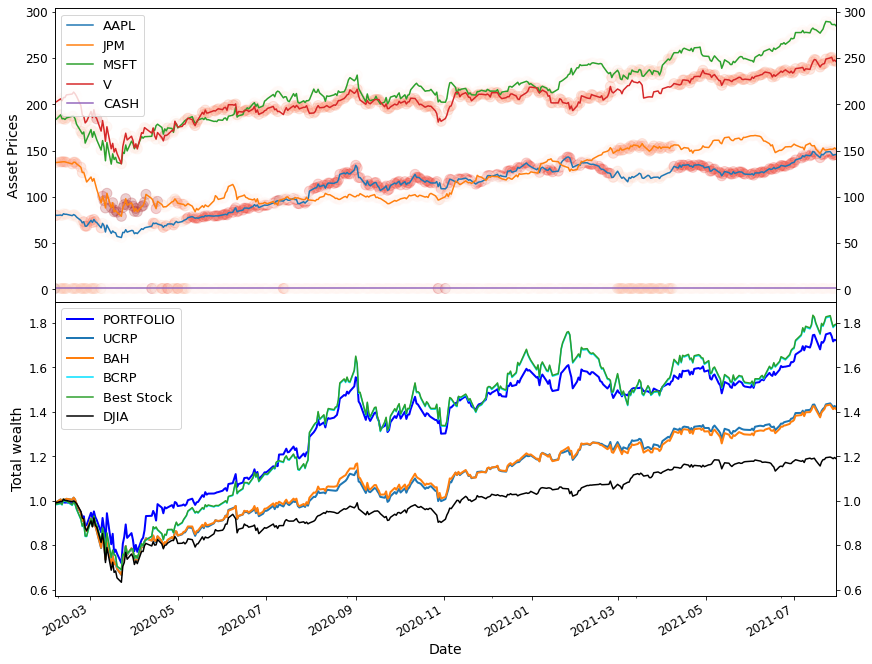

learning_rate: 5e-05
gamma: 0.5
batch_size: 64
buffer_size: 10000
polyak_update: 1.0
epsilon_initial: 0.8 	epislon_final: 0.01 	epislon_fraction: 0.4
feature_extractor:
Sequential(
  (0): Conv2d(4, 4, kernel_size=(1, 8), stride=(1, 1))
  (1): ReLU()
  (2): Conv2d(4, 8, kernel_size=(1, 16), stride=(1, 1))
  (3): ReLU()
  (4): Conv2d(8, 16, kernel_size=(1, 28), stride=(1, 1))
  (5): ReLU()
  (6): Flatten(start_dim=1, end_dim=-1)
)
net_arch: [256, 128, 64]



In [19]:
agent_strategies = []

# for all loaded agents
for model, agent in agents:
    
    # determing action space type
    action_space_type = config.ACTION_SPACE[model]

    # set up test environment
    test_env = PortfolioEnv(
        tickers=TICKERS,
        prices=test, 
        market_prices=market_test,
        window_length=config.WINDOW_LENGTH,
        trading_cost=config.COMMISSION_RATE,
        action_space_type=action_space_type,
    )
    
    print(model)
    # evaluate agent on test environment and plot results
    evalu8(agent, test_env)
    
    # display agent attributes
    display_attributes(agent, test_env.observation_space)    

    # wrap agent weights in universal portfolios interface for comparison
    strategy = AgentStrategy(test_env.record.actions, name=model.upper())
    agent_strategies.append(strategy)

In [20]:
# evaluate each strategy on chosen metrics
results, metrics = evaluate_baselines(test, custom_strategies=agent_strategies, market_data={'DJIA': market_test})

DDPG.DQN.BAH.CRP.BCRP.MPT.UP.EG.Anticor.PAMR.OLMAR.RMR.CWMR.WMAMR.BNN.CORN.ONS.DJIA.

In [21]:
metrics  # .sort_values('sharpe', ascending=False)

,total_wealth,cumulative_return,annualised_return,sharpe,max_drawdown,max_drawdown_period,ulcer_index,profit_factor,winning_pct,beta,alpha,appraisal_ratio,information_ratio,annualised_volatility,annual_turnover
DDPG,1.55953,55.952969,36.798149,1.002642,28.958869,149.527507,4.26358,1.170713,54.278075,0.95831,0.076565,0.507488,0.412645,0.367012,5.379968
DQN,1.721487,72.148653,44.369976,1.132314,27.918722,105.666105,6.276549,1.208743,55.614973,1.037025,0.12833,0.858305,0.925944,0.391852,24.762334
BAH,1.411977,41.197661,29.506246,0.839949,34.231834,113.640905,3.256446,1.141778,55.080214,1.000174,-0.009397,-0.292101,-0.353845,0.351286,0.0
CRP,1.419826,41.98259,29.827194,0.852642,34.332293,113.640905,3.320839,1.146566,54.278075,0.999914,-0.006099,-4.818427,-3.799032,0.349821,2.437476
BCRP,1.789556,78.955573,47.886554,1.158635,31.427266,110.650355,4.406166,1.18855,52.815013,1.003745,0.173803,0.791859,0.792765,0.413301,0.0
MPT,1.230302,23.030151,20.435484,0.571213,46.472778,186.410959,1.420264,1.083827,54.812834,0.960166,-0.088069,-0.707211,-0.821016,0.357756,25.660357
UP,1.417629,41.762913,29.725222,0.849578,34.325746,113.640905,3.3036,1.145543,54.545455,0.999936,-0.007128,-0.996927,-1.366416,0.349882,1.944336
EG,1.419373,41.937328,29.805738,0.852032,34.327305,113.640905,3.317622,1.146346,54.545455,0.999898,-0.006309,-2.392461,-3.072897,0.349819,2.313056
Anticor,1.418631,41.863144,30.965307,0.808704,34.332293,103.672405,3.24371,1.120933,52.673797,0.987078,0.009252,0.055377,0.021648,0.3829,34.743598
PAMR,0.918084,-8.191597,0.622282,0.017482,43.078273,367.837668,0.034829,0.967387,54.812834,0.94957,-0.283481,-2.190883,-2.322735,0.355964,100.725734


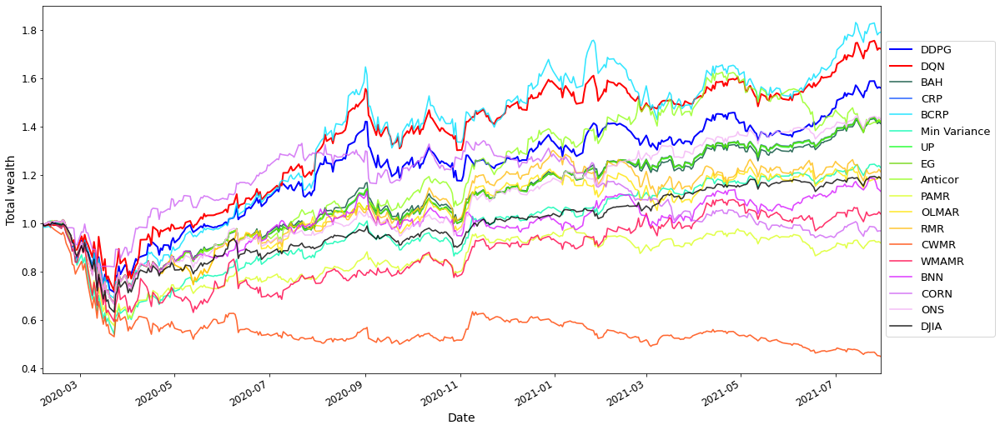

In [22]:
# create color palette to display each strategy results
palette = sns.color_palette(palette='gist_ncar', n_colors=len(config.OLPS_STRATEGIES))

# hard code colors for agents and DJIA
palette = ['blue', 'red'] + palette + ['black']

# set up plot figure and axis
fig, ax = plt.subplots()

# for each strategy
for name, result, color in zip(results.index, results, palette):
    if name == 'MPT':
        name = 'Min Variance'
    if name in ['DDPG', 'DQN']:
        alpha = 1
        linewidth=2
    else:
        alpha = 0.8
        linewidth=1.6

    # plot performance
    result.plot(assets=False, weights=False, ucrp=False, bah=False, 
                portfolio_label=name, color=color, ax=ax, 
                alpha=alpha, linewidth=linewidth)

# set x-axis limits
ind = test.index
ax.set_xlim(ind[config.WINDOW_LENGTH-1], ind[-1])
# position legend
plt.legend(bbox_to_anchor=(1,0.92))
plt.show()

#### Individual plots for each strategy

DDPG Summary:
    Profit factor: 1.17
    Sharpe ratio: 1.00 ± 1.01
    Ulcer index: 4.26
    Information ratio (wrt UCRP): 0.41
    Appraisal ratio (CAPM): -1.04 ± 0.83
    Appraisal ratio (wrt UCRP): 0.51 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 0.96 / 7.657%
    Annualized return: 36.80%
    Annualized volatility: 36.70%
    Longest drawdown: 150 days
    Max drawdown: 28.96%
    Winning days: 54.3%
    Annual turnover: 5.4
        


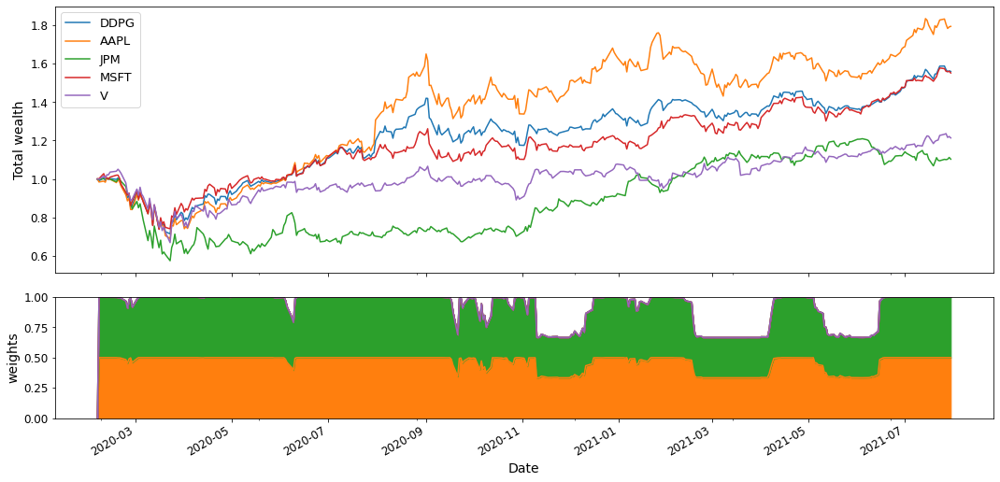

DQN Summary:
    Profit factor: 1.21
    Sharpe ratio: 1.13 ± 1.05
    Ulcer index: 6.28
    Information ratio (wrt UCRP): 0.93
    Appraisal ratio (CAPM): 0.67 ± 0.83
    Appraisal ratio (wrt UCRP): 0.86 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.04 / 12.833%
    Annualized return: 44.37%
    Annualized volatility: 39.19%
    Longest drawdown: 106 days
    Max drawdown: 27.92%
    Winning days: 55.6%
    Annual turnover: 24.8
        


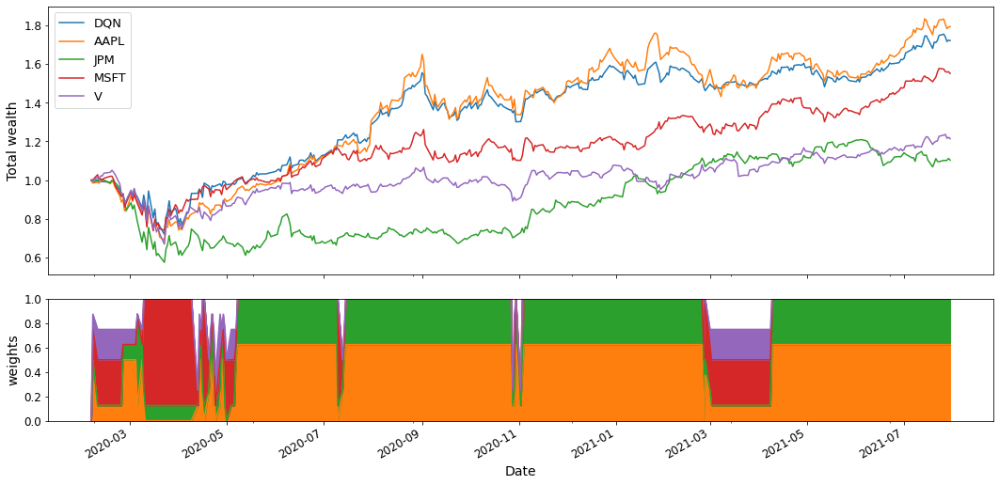

BAH Summary:
    Profit factor: 1.14
    Sharpe ratio: 0.84 ± 0.96
    Ulcer index: 3.26
    Information ratio (wrt UCRP): -0.35
    Appraisal ratio (CAPM): -2.47 ± 0.83
    Appraisal ratio (wrt UCRP): -0.29 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.00 / -0.940%
    Annualized return: 29.51%
    Annualized volatility: 35.13%
    Longest drawdown: 114 days
    Max drawdown: 34.23%
    Winning days: 55.1%
    Annual turnover: 0.0
        


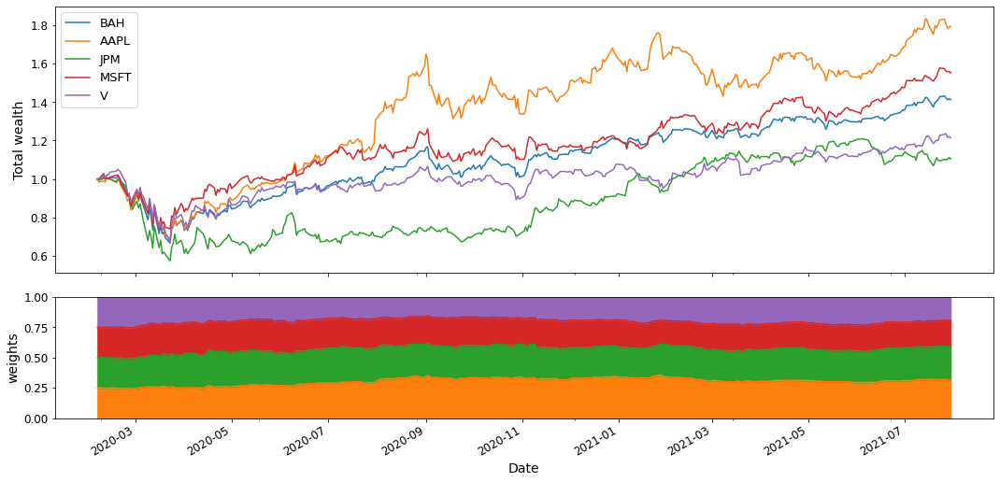

CRP Summary:
    Profit factor: 1.15
    Sharpe ratio: 0.85 ± 0.96
    Ulcer index: 3.32
    Information ratio (wrt UCRP): -3.80
    Appraisal ratio (CAPM): -4.83 ± 0.83
    Appraisal ratio (wrt UCRP): -4.82 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.00 / -0.610%
    Annualized return: 29.83%
    Annualized volatility: 34.98%
    Longest drawdown: 114 days
    Max drawdown: 34.33%
    Winning days: 54.3%
    Annual turnover: 2.4
        


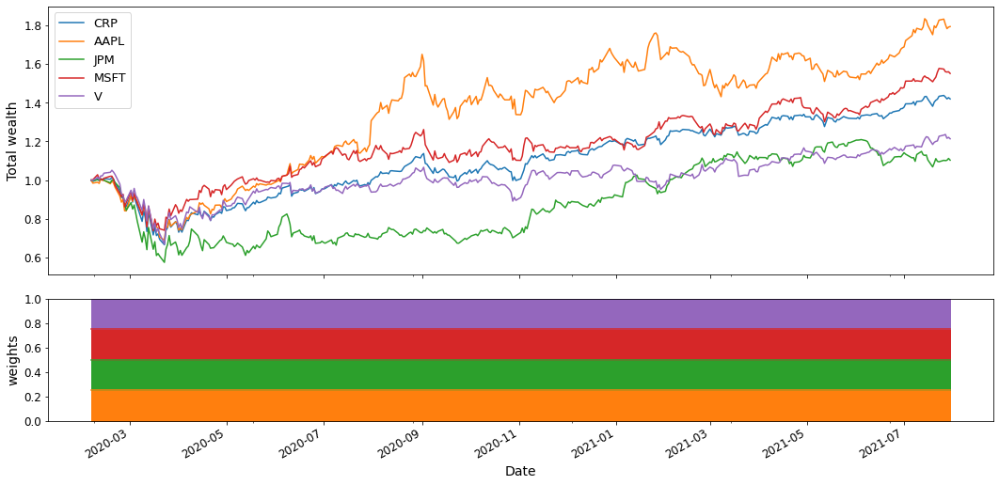

BCRP Summary:
    Profit factor: 1.19
    Sharpe ratio: 1.16 ± 1.06
    Ulcer index: 4.41
    Information ratio (wrt UCRP): 0.79
    Appraisal ratio (CAPM): 0.00 ± 1.05
    Appraisal ratio (wrt UCRP): 0.79 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.00 / 17.380%
    Annualized return: 47.89%
    Annualized volatility: 41.33%
    Longest drawdown: 111 days
    Max drawdown: 31.43%
    Winning days: 52.8%
    Annual turnover: 0.0
        


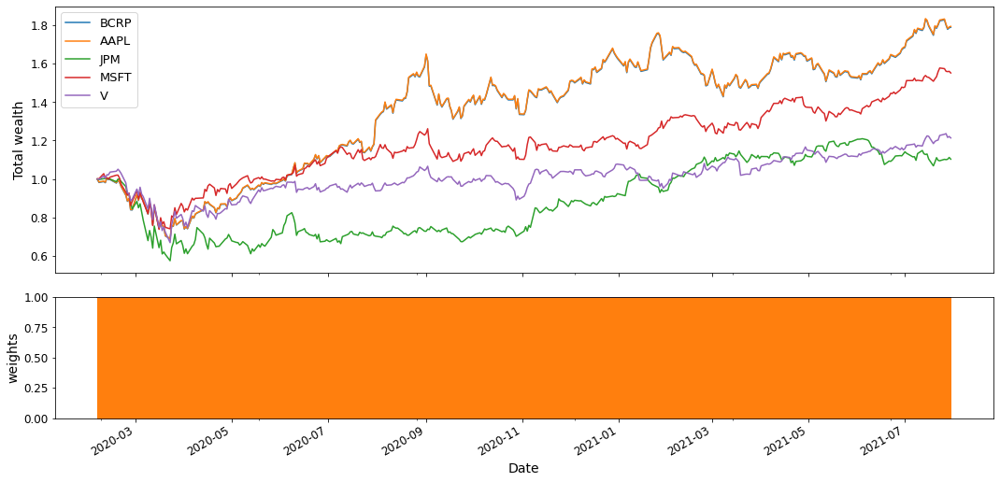

MPT Summary:
    Profit factor: 1.08
    Sharpe ratio: 0.57 ± 0.89
    Ulcer index: 1.42
    Information ratio (wrt UCRP): -0.82
    Appraisal ratio (CAPM): -0.53 ± 0.83
    Appraisal ratio (wrt UCRP): -0.71 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 0.96 / -8.807%
    Annualized return: 20.44%
    Annualized volatility: 35.78%
    Longest drawdown: 186 days
    Max drawdown: 46.47%
    Winning days: 54.8%
    Annual turnover: 25.7
        


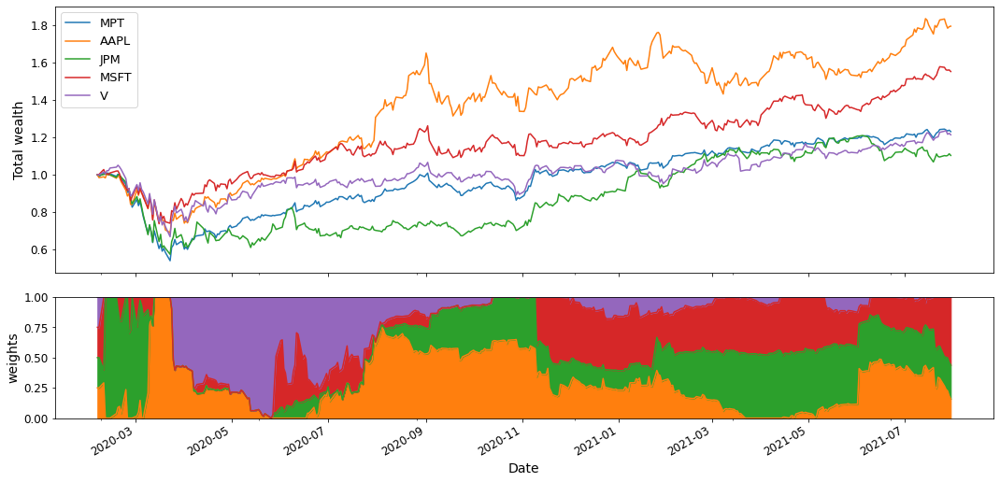

UP Summary:
    Profit factor: 1.15
    Sharpe ratio: 0.85 ± 0.96
    Ulcer index: 3.30
    Information ratio (wrt UCRP): -1.37
    Appraisal ratio (CAPM): -3.21 ± 0.83
    Appraisal ratio (wrt UCRP): -1.00 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.00 / -0.713%
    Annualized return: 29.73%
    Annualized volatility: 34.99%
    Longest drawdown: 114 days
    Max drawdown: 34.33%
    Winning days: 54.5%
    Annual turnover: 1.9
        


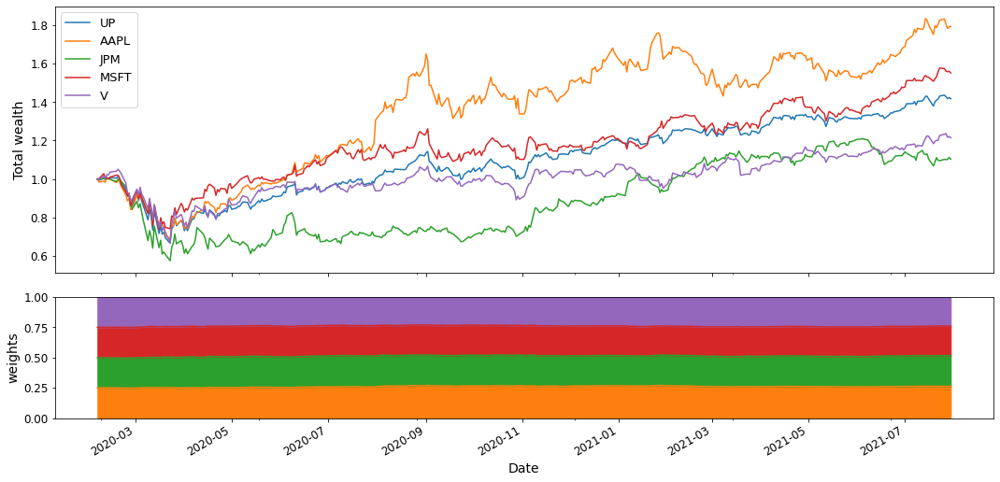

EG Summary:
    Profit factor: 1.15
    Sharpe ratio: 0.85 ± 0.96
    Ulcer index: 3.32
    Information ratio (wrt UCRP): -3.07
    Appraisal ratio (CAPM): -4.27 ± 0.83
    Appraisal ratio (wrt UCRP): -2.39 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.00 / -0.631%
    Annualized return: 29.81%
    Annualized volatility: 34.98%
    Longest drawdown: 114 days
    Max drawdown: 34.33%
    Winning days: 54.5%
    Annual turnover: 2.3
        


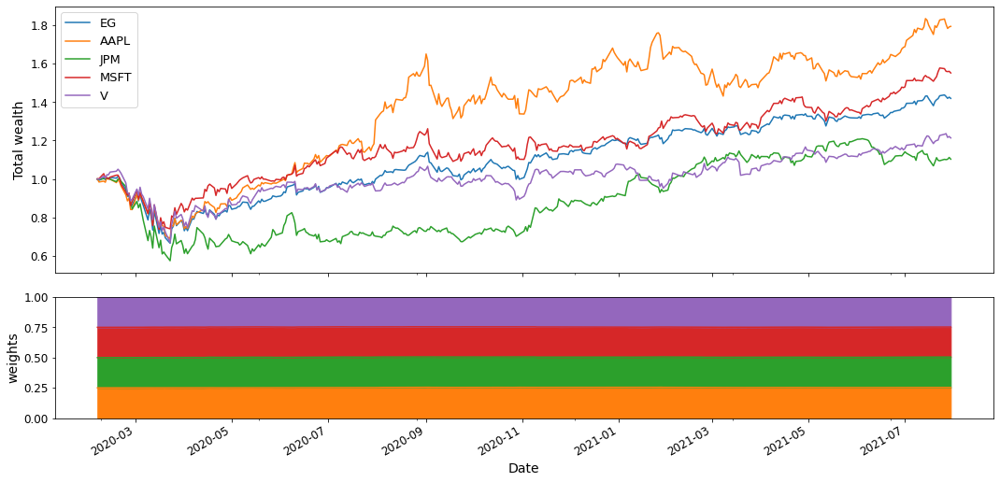

Anticor Summary:
    Profit factor: 1.12
    Sharpe ratio: 0.81 ± 0.95
    Ulcer index: 3.24
    Information ratio (wrt UCRP): 0.02
    Appraisal ratio (CAPM): 0.15 ± 0.83
    Appraisal ratio (wrt UCRP): 0.06 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 0.99 / 0.925%
    Annualized return: 30.97%
    Annualized volatility: 38.29%
    Longest drawdown: 104 days
    Max drawdown: 34.33%
    Winning days: 52.7%
    Annual turnover: 34.7
        


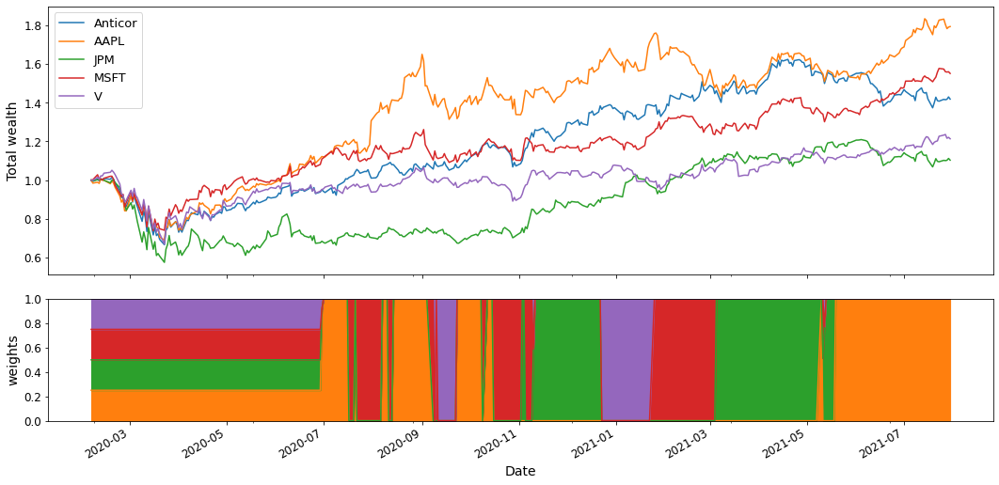

PAMR Summary:
    Profit factor: 0.97
    Sharpe ratio: 0.02 ± 0.82
    Ulcer index: 0.03
    Information ratio (wrt UCRP): -2.32
    Appraisal ratio (CAPM): -2.05 ± 0.83
    Appraisal ratio (wrt UCRP): -2.19 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 0.95 / -28.348%
    Annualized return: 0.62%
    Annualized volatility: 35.60%
    Longest drawdown: 368 days
    Max drawdown: 43.08%
    Winning days: 54.8%
    Annual turnover: 100.7
        


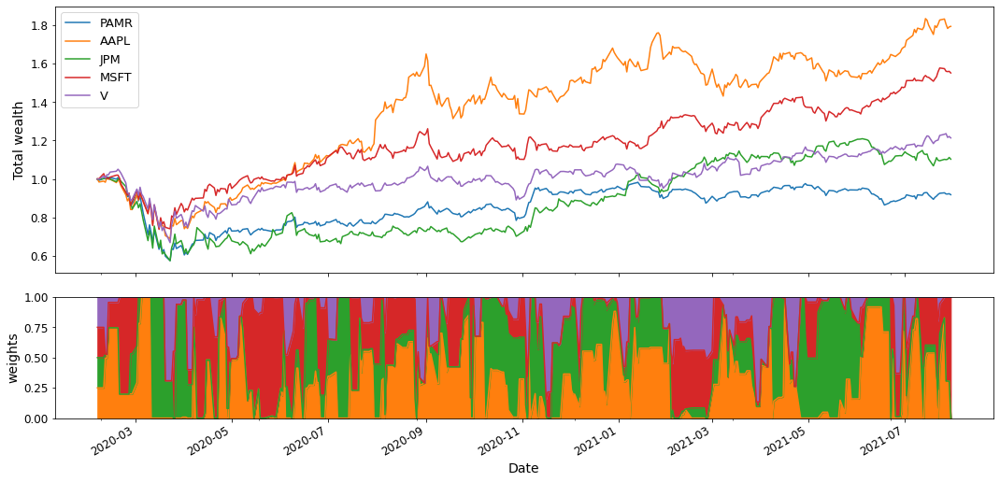

OLMAR Summary:
    Profit factor: 1.05
    Sharpe ratio: 0.48 ± 0.87
    Ulcer index: 1.89
    Information ratio (wrt UCRP): -0.62
    Appraisal ratio (CAPM): -0.56 ± 0.83
    Appraisal ratio (wrt UCRP): -0.65 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.03 / -11.920%
    Annualized return: 19.46%
    Annualized volatility: 40.30%
    Longest drawdown: 111 days
    Max drawdown: 34.33%
    Winning days: 50.8%
    Annual turnover: 56.8
        


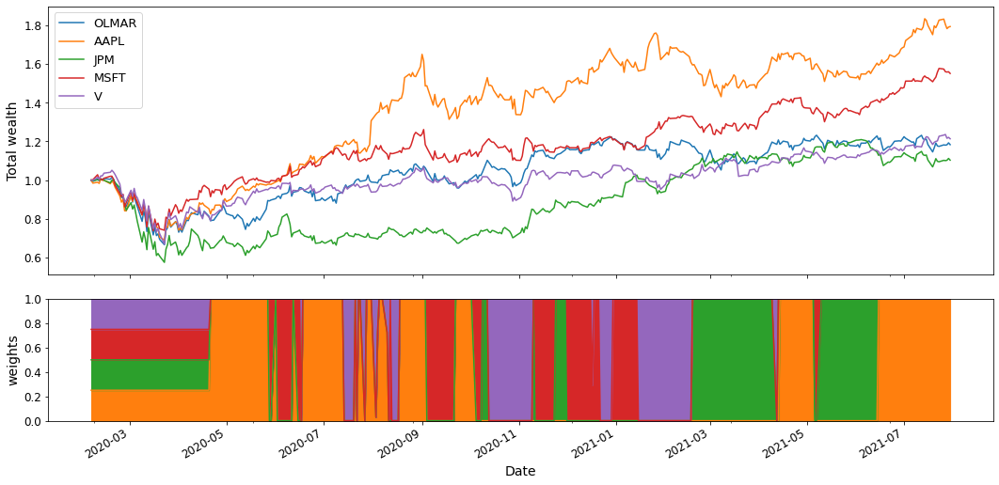

RMR Summary:
    Profit factor: 1.06
    Sharpe ratio: 0.52 ± 0.88
    Ulcer index: 2.01
    Information ratio (wrt UCRP): -0.51
    Appraisal ratio (CAPM): -0.43 ± 0.83
    Appraisal ratio (wrt UCRP): -0.53 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.02 / -9.987%
    Annualized return: 21.11%
    Annualized volatility: 40.23%
    Longest drawdown: 145 days
    Max drawdown: 34.33%
    Winning days: 51.9%
    Annual turnover: 57.3
        


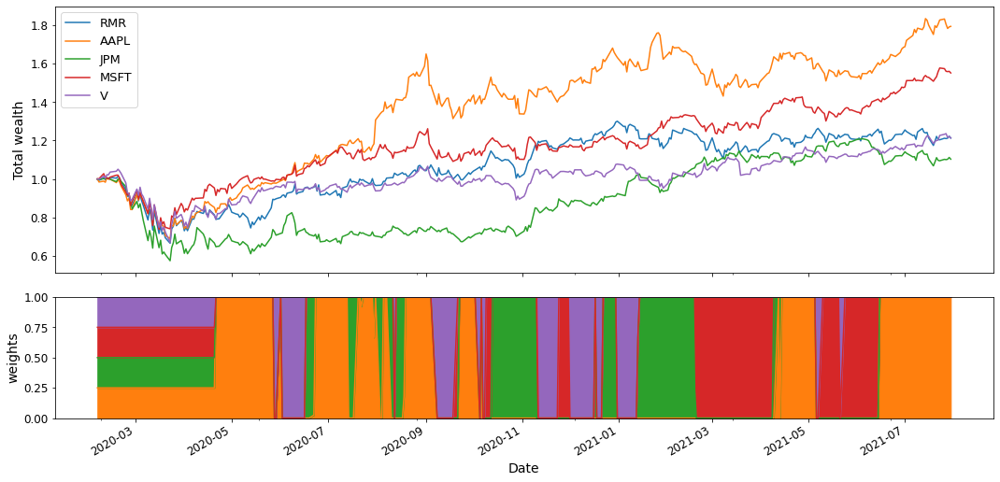

CWMR Summary:
    Profit factor: 0.77
    Sharpe ratio: -1.10 ± 1.04
    Ulcer index: -1.02
    Information ratio (wrt UCRP): -3.67
    Appraisal ratio (CAPM): -3.71 ± 0.83
    Appraisal ratio (wrt UCRP): -3.69 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.03 / -76.987%
    Annualized return: -45.58%
    Annualized volatility: 41.41%
    Longest drawdown: 372 days
    Max drawdown: 55.05%
    Winning days: 44.9%
    Annual turnover: 354.1
        


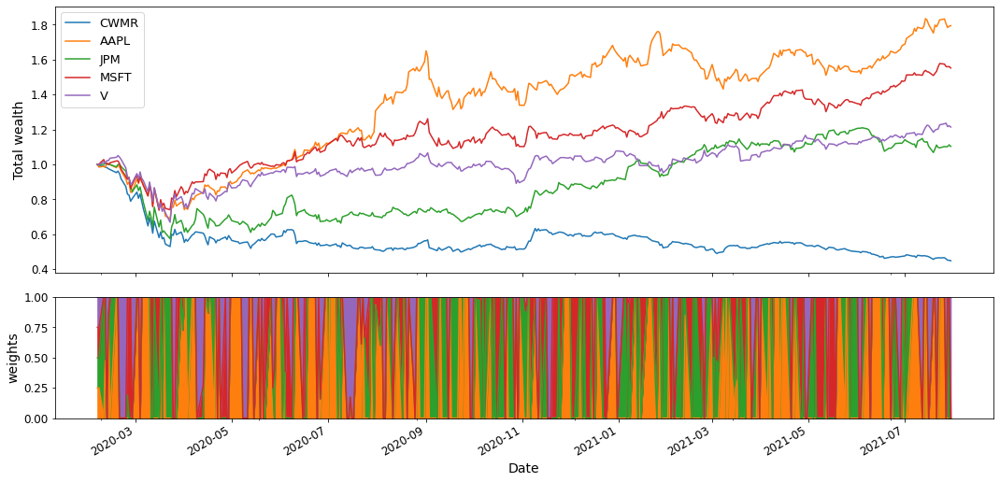

WMAMR Summary:
    Profit factor: 1.01
    Sharpe ratio: 0.29 ± 0.84
    Ulcer index: 0.73
    Information ratio (wrt UCRP): -0.74
    Appraisal ratio (CAPM): -0.79 ± 0.83
    Appraisal ratio (wrt UCRP): -0.96 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.16 / -22.029%
    Annualized return: 13.33%
    Annualized volatility: 46.52%
    Longest drawdown: 258 days
    Max drawdown: 41.12%
    Winning days: 51.3%
    Annual turnover: 78.8
        


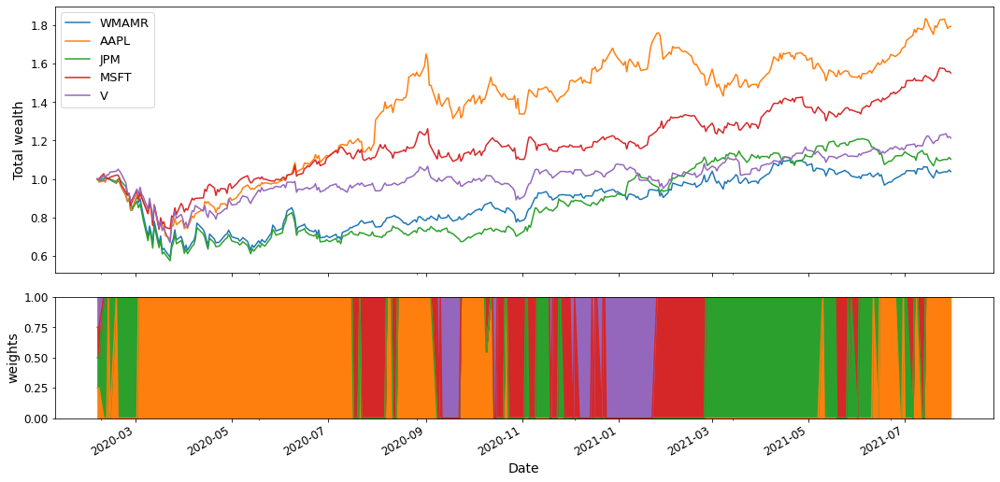

BNN Summary:
    Profit factor: 1.04
    Sharpe ratio: 0.41 ± 0.86
    Ulcer index: 1.39
    Information ratio (wrt UCRP): -0.99
    Appraisal ratio (CAPM): -2.03 ± 0.83
    Appraisal ratio (wrt UCRP): -0.94 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 0.98 / -14.471%
    Annualized return: 15.41%
    Annualized volatility: 37.55%
    Longest drawdown: 154 days
    Max drawdown: 34.33%
    Winning days: 51.1%
    Annual turnover: 35.0
        


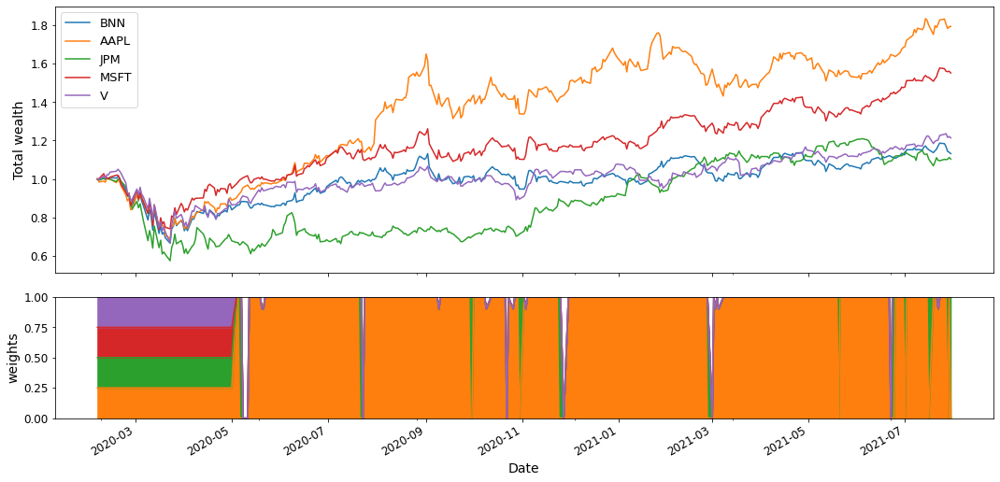

CORN Summary:
    Profit factor: 0.98
    Sharpe ratio: 0.07 ± 0.82
    Ulcer index: 0.13
    Information ratio (wrt UCRP): -0.98
    Appraisal ratio (CAPM): -0.90 ± 0.83
    Appraisal ratio (wrt UCRP): -0.56 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 0.49 / -13.044%
    Annualized return: 1.92%
    Annualized volatility: 28.89%
    Longest drawdown: 175 days
    Max drawdown: 29.93%
    Winning days: 39.7%
    Annual turnover: 244.7
        


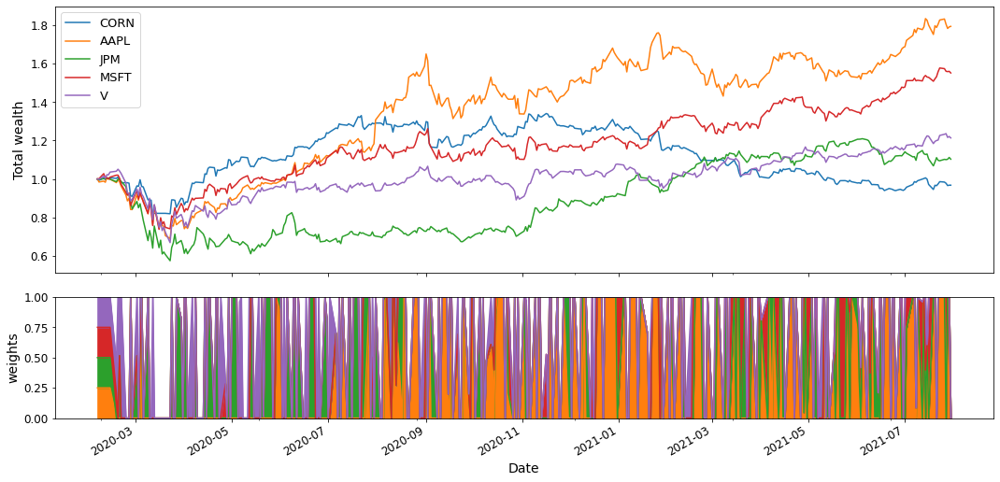

ONS Summary:
    Profit factor: 1.15
    Sharpe ratio: 0.85 ± 0.96
    Ulcer index: 3.37
    Information ratio (wrt UCRP): 0.01
    Appraisal ratio (CAPM): 1.96 ± 0.83
    Appraisal ratio (wrt UCRP): 0.03 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.00 / 0.291%
    Annualized return: 30.72%
    Annualized volatility: 36.25%
    Longest drawdown: 130 days
    Max drawdown: 34.63%
    Winning days: 52.7%
    Annual turnover: 8.8
        


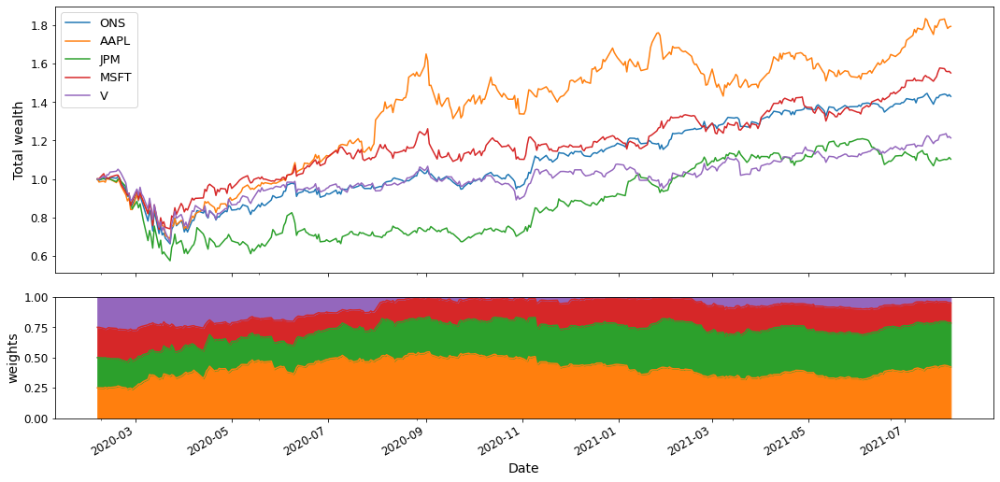

In [23]:
# create palette for assets in portfolio
palette = sns.color_palette(n_colors=len(TICKERS)+1)

# for each strategy
for i, result in enumerate(results):
    name = results.index[i]
    # ignore market
    if name=='DJIA':
        continue
    print(name, result.summary())
    # plot performance and asset weights
    result.plot(assets=True, weights=True, ucrp=False, bah=False, portfolio_label=name, color=palette)
    plt.show()

### Generalisation 
On different asset portfolios

In [24]:
agents = []
# agents = [load_model('models/DQN_best.zip')]

# load models from saved paths
for model, path in config.MODEL_PATH.items():
    agents.append((model, MODELS[model].load(path)))

ddpg
1 WBA, JPM, MRK, WMT
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.077

    Profit factor: 1.03
    Sharpe ratio: 0.32 ± 0.84
    Ulcer index: 0.61
    Information ratio (wrt UCRP): 0.08
    Appraisal ratio (CAPM): 0.70 ± 0.83
    Appraisal ratio (wrt UCRP): 0.08 ± 0.82
    UCRP sharpe: 0.32 ± 0.84
    Beta / Alpha: 1.01 / 1.118%
    Annualized return: 9.97%
    Annualized volatility: 31.62%
    Longest drawdown: 228 days
    Max drawdown: 29.61%
    Winning days: 48.9%
    Annual turnover: 6.9
        
Final Holdings: [0.358 0.    0.358 0.    0.284]


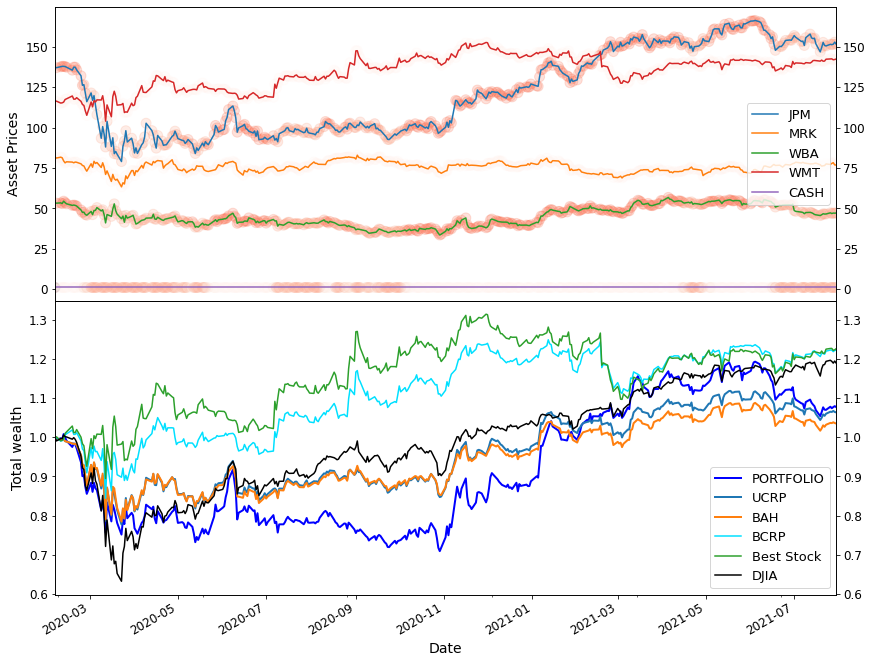

2 UNH, AMGN, NKE, VZ
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.1487

    Profit factor: 1.07
    Sharpe ratio: 0.46 ± 0.86
    Ulcer index: 2.49
    Information ratio (wrt UCRP): -0.56
    Appraisal ratio (CAPM): -0.94 ± 0.83
    Appraisal ratio (wrt UCRP): -0.61 ± 0.82
    UCRP sharpe: 0.73 ± 0.93
    Beta / Alpha: 1.04 / -6.640%
    Annualized return: 13.92%
    Annualized volatility: 30.25%
    Longest drawdown: 57 days
    Max drawdown: 27.63%
    Winning days: 49.7%
    Annual turnover: 7.1
        
Final Holdings: [0.338 0.    0.338 0.    0.323]


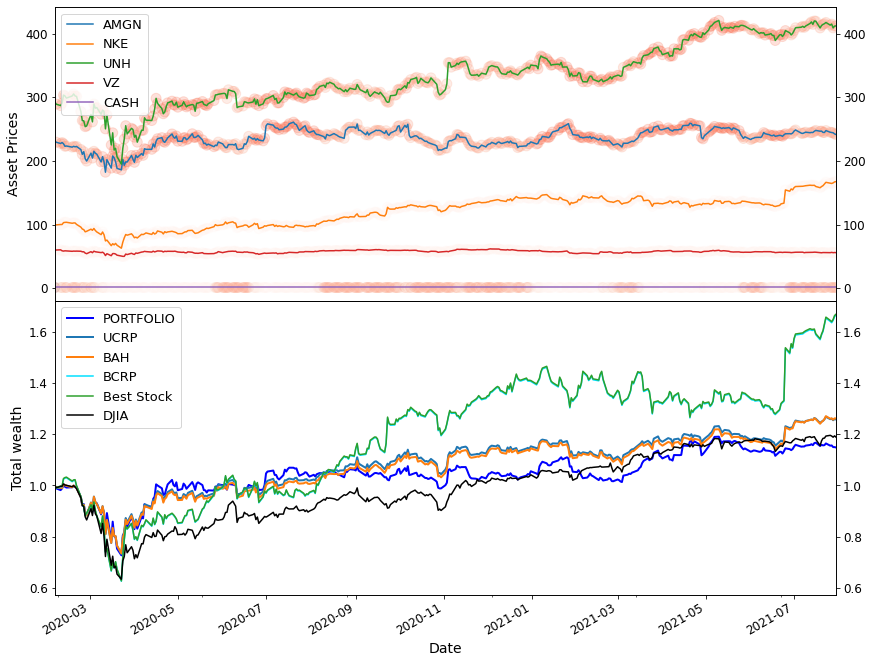

3 BA, INTC, V, UNH
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.0898

    Profit factor: 1.03
    Sharpe ratio: 0.34 ± 0.85
    Ulcer index: 0.90
    Information ratio (wrt UCRP): 0.07
    Appraisal ratio (CAPM): 0.37 ± 0.83
    Appraisal ratio (wrt UCRP): 0.19 ± 0.82
    UCRP sharpe: 0.30 ± 0.84
    Beta / Alpha: 0.87 / 3.016%
    Annualized return: 13.36%
    Annualized volatility: 38.82%
    Longest drawdown: 202 days
    Max drawdown: 42.76%
    Winning days: 47.9%
    Annual turnover: 9.0
        
Final Holdings: [0.351 0.    0.351 0.    0.297]


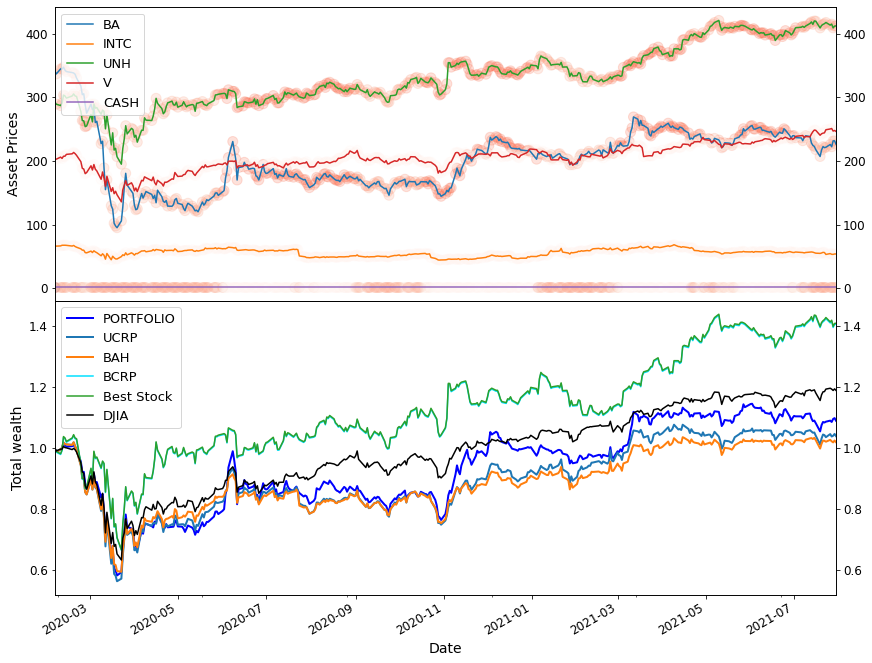

4 MSFT, GS, BA, AMGN
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.182

    Profit factor: 1.08
    Sharpe ratio: 0.52 ± 0.88
    Ulcer index: 2.10
    Information ratio (wrt UCRP): -0.30
    Appraisal ratio (CAPM): -1.35 ± 0.83
    Appraisal ratio (wrt UCRP): 0.05 ± 0.82
    UCRP sharpe: 0.56 ± 0.88
    Beta / Alpha: 0.72 / 0.779%
    Annualized return: 16.11%
    Annualized volatility: 31.14%
    Longest drawdown: 114 days
    Max drawdown: 30.68%
    Winning days: 52.4%
    Annual turnover: 7.6
        
Final Holdings: [0.449 0.    0.449 0.    0.102]


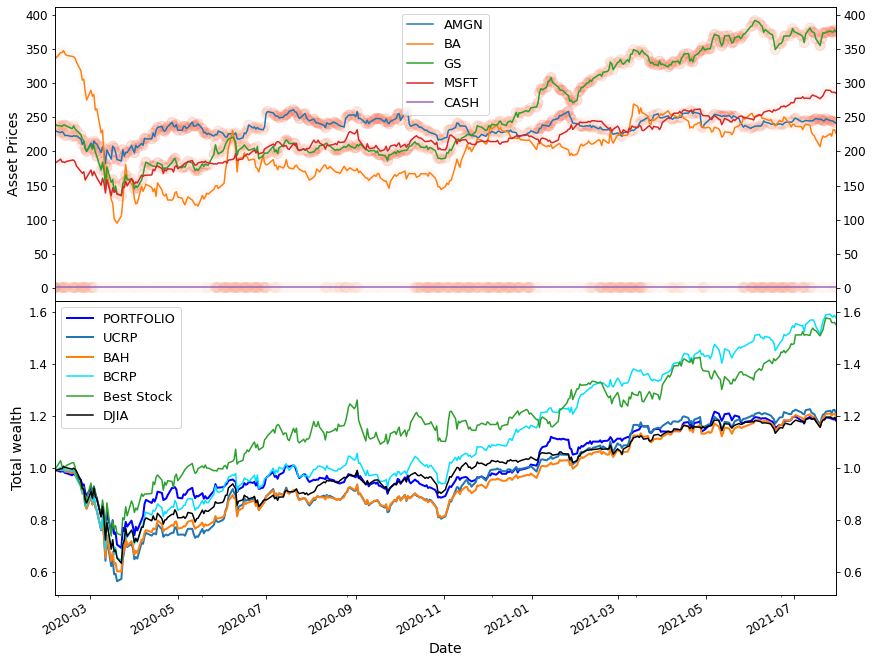

5 VZ, MSFT, AXP, KO
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.3969

    Profit factor: 1.15
    Sharpe ratio: 0.88 ± 0.97
    Ulcer index: 3.00
    Information ratio (wrt UCRP): 0.97
    Appraisal ratio (CAPM): 0.29 ± 0.83
    Appraisal ratio (wrt UCRP): 1.03 ± 0.82
    UCRP sharpe: 0.57 ± 0.89
    Beta / Alpha: 0.97 / 10.826%
    Annualized return: 27.37%
    Annualized volatility: 30.98%
    Longest drawdown: 198 days
    Max drawdown: 30.26%
    Winning days: 54.5%
    Annual turnover: 6.2
        
Final Holdings: [0.499 0.    0.499 0.    0.001]


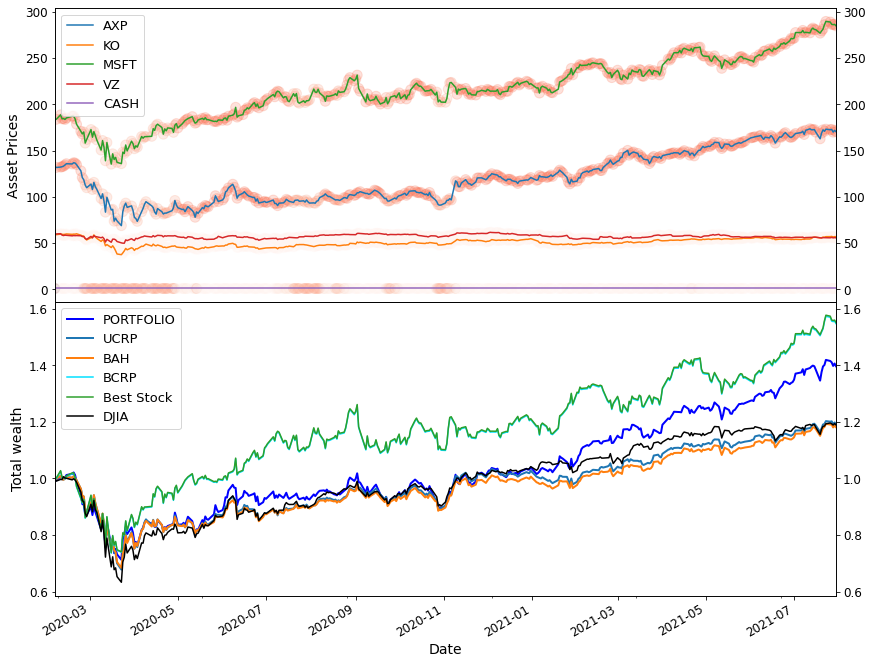

6 WMT, MMM, MCD, JNJ
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.1146

    Profit factor: 1.06
    Sharpe ratio: 0.43 ± 0.86
    Ulcer index: 1.77
    Information ratio (wrt UCRP): -0.55
    Appraisal ratio (CAPM): -0.74 ± 0.83
    Appraisal ratio (wrt UCRP): -0.34 ± 0.82
    UCRP sharpe: 0.64 ± 0.90
    Beta / Alpha: 0.86 / -3.288%
    Annualized return: 9.96%
    Annualized volatility: 22.95%
    Longest drawdown: 211 days
    Max drawdown: 23.86%
    Winning days: 54.5%
    Annual turnover: 8.1
        
Final Holdings: [0.492 0.    0.492 0.    0.015]


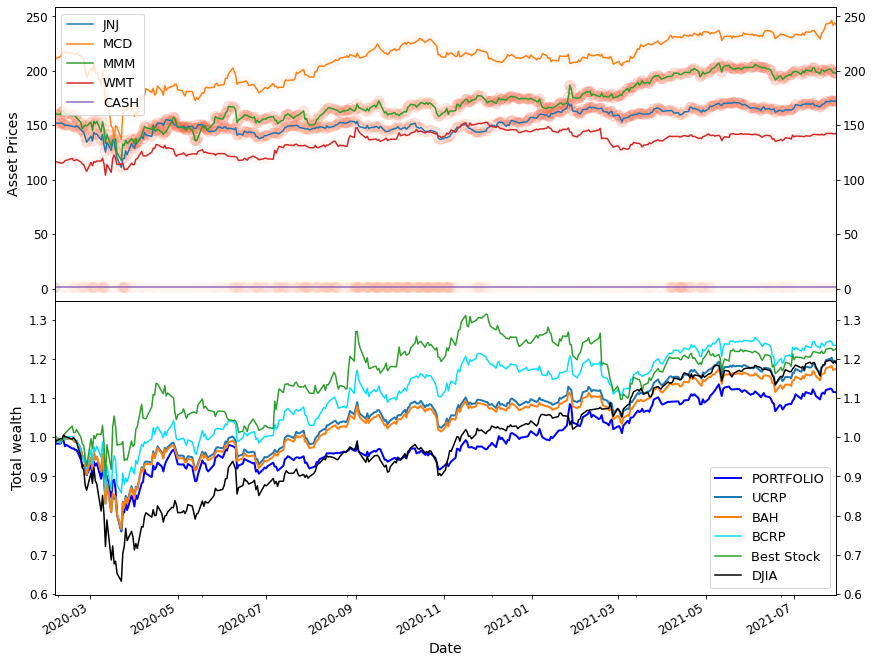

7 NKE, GS, CSCO, MSFT
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.2563

    Profit factor: 1.11
    Sharpe ratio: 0.64 ± 0.90
    Ulcer index: 2.73
    Information ratio (wrt UCRP): -0.95
    Appraisal ratio (CAPM): -0.88 ± 0.83
    Appraisal ratio (wrt UCRP): -0.66 ± 0.83
    UCRP sharpe: 1.02 ± 1.01
    Beta / Alpha: 0.88 / -8.792%
    Annualized return: 20.45%
    Annualized volatility: 31.76%
    Longest drawdown: 118 days
    Max drawdown: 28.78%
    Winning days: 53.5%
    Annual turnover: 7.8
        
Final Holdings: [0.341 0.    0.341 0.    0.317]


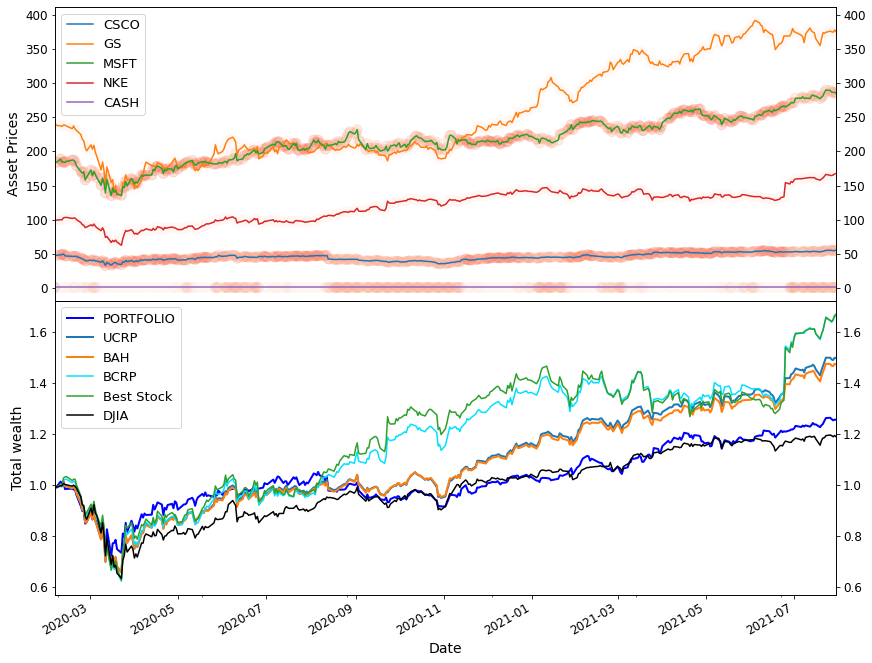

8 V, TRV, MCD, CRM
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.2259

    Profit factor: 1.09
    Sharpe ratio: 0.59 ± 0.89
    Ulcer index: 2.13
    Information ratio (wrt UCRP): -0.04
    Appraisal ratio (CAPM): 0.11 ± 0.83
    Appraisal ratio (wrt UCRP): 0.14 ± 0.82
    UCRP sharpe: 0.58 ± 0.89
    Beta / Alpha: 0.90 / 1.706%
    Annualized return: 18.88%
    Annualized volatility: 31.95%
    Longest drawdown: 132 days
    Max drawdown: 30.73%
    Winning days: 52.1%
    Annual turnover: 7.3
        
Final Holdings: [0.357 0.    0.357 0.    0.286]


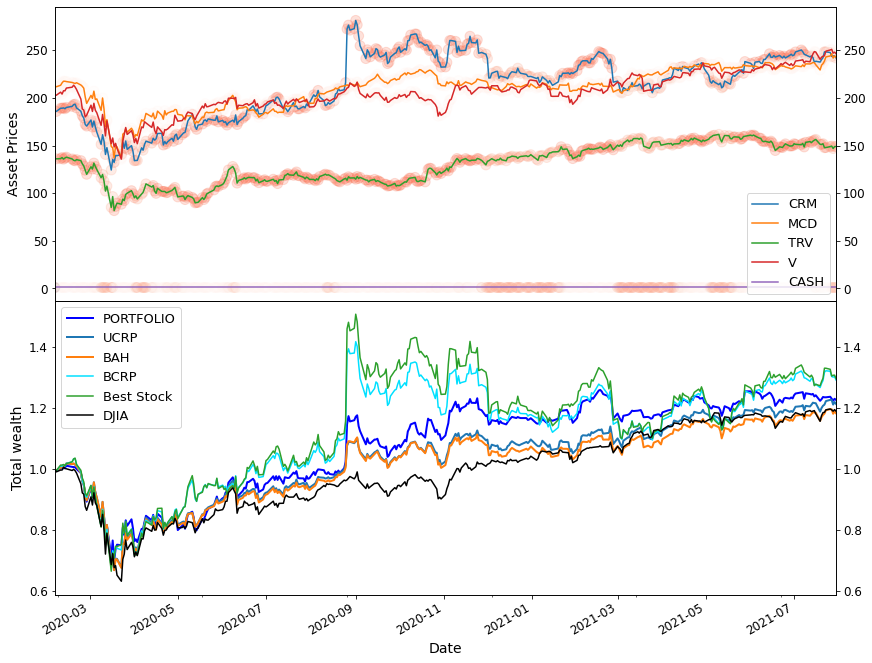

9 WMT, MCD, JNJ, INTC
[*********************100%***********************]  4 of 4 completed
Total wealth: 0.9807

    Profit factor: 0.99
    Sharpe ratio: 0.09 ± 0.82
    Ulcer index: 0.21
    Information ratio (wrt UCRP): -0.65
    Appraisal ratio (CAPM): -0.06 ± 0.83
    Appraisal ratio (wrt UCRP): -0.57 ± 0.82
    UCRP sharpe: 0.37 ± 0.85
    Beta / Alpha: 0.91 / -6.661%
    Annualized return: 2.39%
    Annualized volatility: 27.14%
    Longest drawdown: 272 days
    Max drawdown: 25.48%
    Winning days: 52.1%
    Annual turnover: 6.3
        
Final Holdings: [0.334 0.    0.334 0.    0.332]


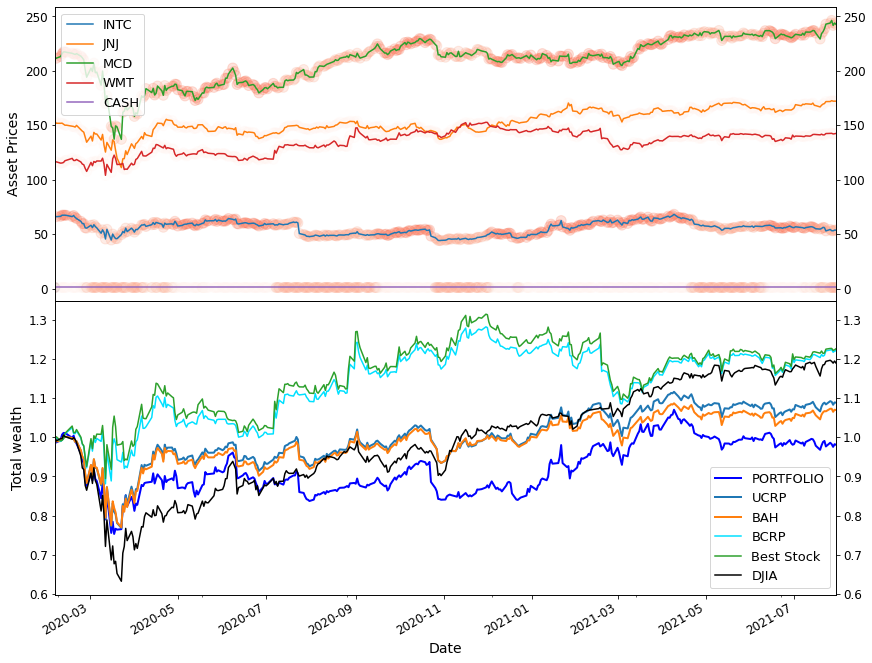

10 AXP, JNJ, TRV, PG
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.2295

    Profit factor: 1.10
    Sharpe ratio: 0.65 ± 0.90
    Ulcer index: 1.97
    Information ratio (wrt UCRP): 0.03
    Appraisal ratio (CAPM): 0.38 ± 0.83
    Appraisal ratio (wrt UCRP): 0.41 ± 0.82
    UCRP sharpe: 0.55 ± 0.88
    Beta / Alpha: 0.82 / 3.607%
    Annualized return: 17.63%
    Annualized volatility: 27.16%
    Longest drawdown: 185 days
    Max drawdown: 28.20%
    Winning days: 54.0%
    Annual turnover: 6.2
        
Final Holdings: [0.5   0.    0.5   0.    0.001]


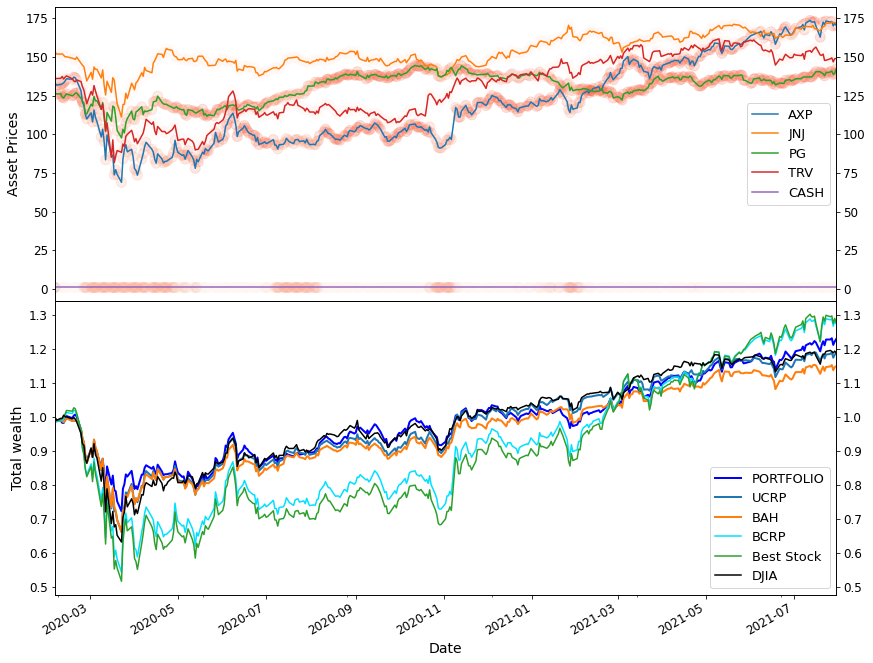

dqn
1 CAT, NKE, CSCO, DOW
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.0988

    Profit factor: 1.04
    Sharpe ratio: 0.36 ± 0.85
    Ulcer index: 1.21
    Information ratio (wrt UCRP): -1.32
    Appraisal ratio (CAPM): -1.51 ± 0.83
    Appraisal ratio (wrt UCRP): -1.22 ± 0.82
    UCRP sharpe: 0.88 ± 0.97
    Beta / Alpha: 0.96 / -16.529%
    Annualized return: 13.08%
    Annualized volatility: 36.53%
    Longest drawdown: 137 days
    Max drawdown: 39.69%
    Winning days: 53.2%
    Annual turnover: 45.6
        
Final Holdings: [0.125 0.375 0.25  0.    0.25 ]


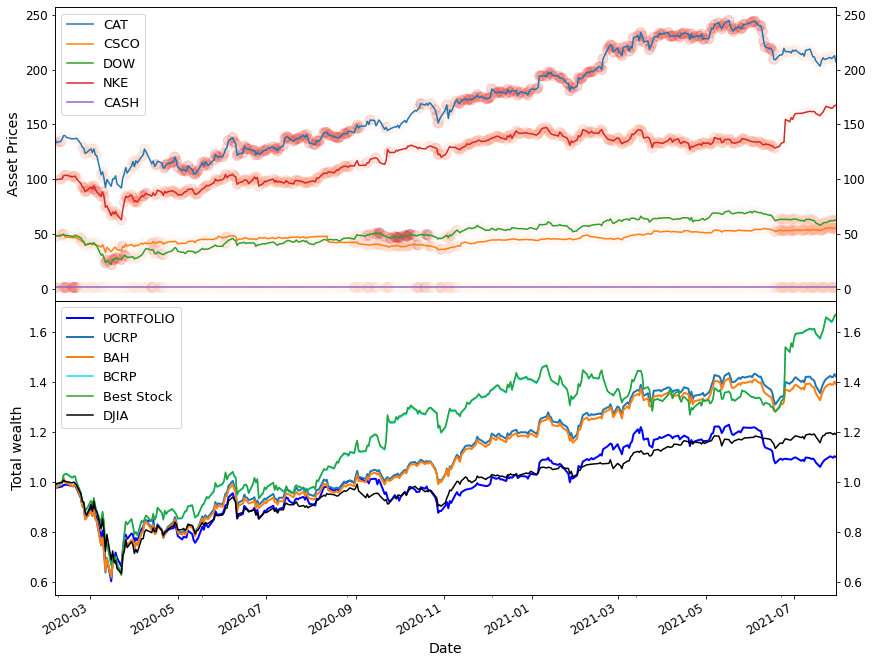

2 HON, CRM, CVX, WMT
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.0002

    Profit factor: 1.00
    Sharpe ratio: 0.21 ± 0.83
    Ulcer index: 0.64
    Information ratio (wrt UCRP): -0.53
    Appraisal ratio (CAPM): -0.57 ± 0.83
    Appraisal ratio (wrt UCRP): -0.64 ± 0.82
    UCRP sharpe: 0.65 ± 0.90
    Beta / Alpha: 1.12 / -14.112%
    Annualized return: 8.59%
    Annualized volatility: 41.41%
    Longest drawdown: 228 days
    Max drawdown: 41.24%
    Winning days: 50.5%
    Annual turnover: 74.0
        
Final Holdings: [0.5   0.    0.125 0.125 0.25 ]


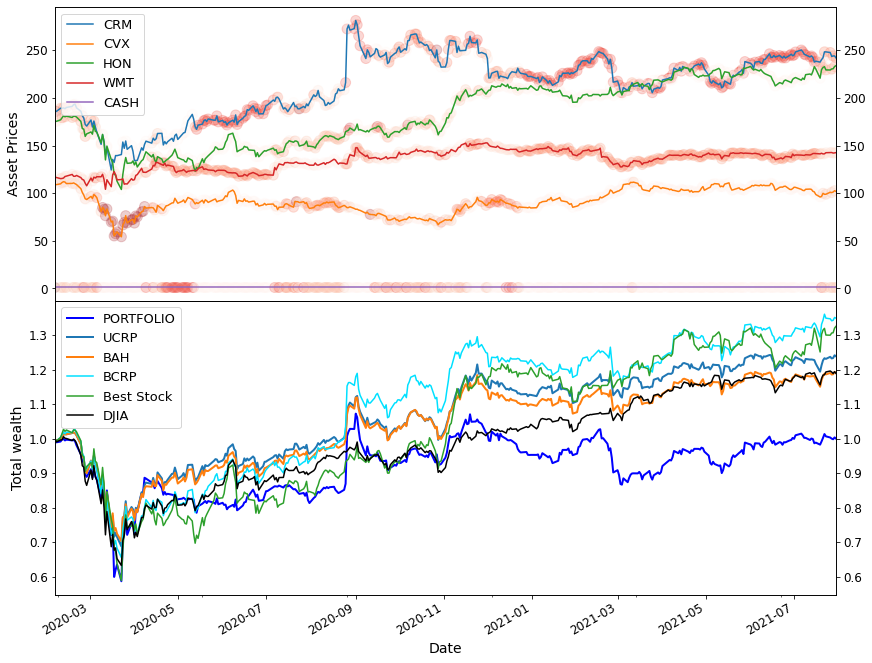

3 WMT, IBM, GS, CRM
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.16

    Profit factor: 1.06
    Sharpe ratio: 0.45 ± 0.86
    Ulcer index: 1.30
    Information ratio (wrt UCRP): -0.19
    Appraisal ratio (CAPM): -0.88 ± 0.83
    Appraisal ratio (wrt UCRP): -0.27 ± 0.82
    UCRP sharpe: 0.71 ± 0.92
    Beta / Alpha: 1.09 / -5.601%
    Annualized return: 17.35%
    Annualized volatility: 38.53%
    Longest drawdown: 228 days
    Max drawdown: 32.22%
    Winning days: 52.1%
    Annual turnover: 39.8
        
Final Holdings: [0.625 0.    0.    0.375 0.   ]


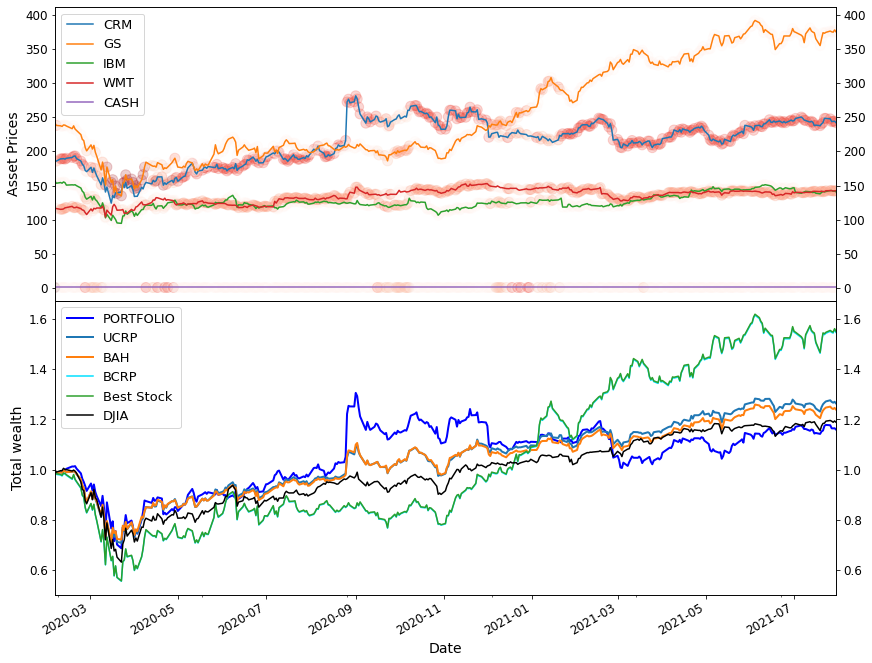

4 DIS, DOW, KO, CVX
[*********************100%***********************]  4 of 4 completed
Total wealth: 0.8099

    Profit factor: 0.92
    Sharpe ratio: -0.22 ± 0.83
    Ulcer index: -0.37
    Information ratio (wrt UCRP): -1.45
    Appraisal ratio (CAPM): -1.45 ± 0.83
    Appraisal ratio (wrt UCRP): -1.37 ± 0.82
    UCRP sharpe: 0.43 ± 0.86
    Beta / Alpha: 0.85 / -21.505%
    Annualized return: -7.76%
    Annualized volatility: 35.93%
    Longest drawdown: 362 days
    Max drawdown: 34.13%
    Winning days: 50.8%
    Annual turnover: 46.2
        
Final Holdings: [0.    0.    0.    0.375 0.625]


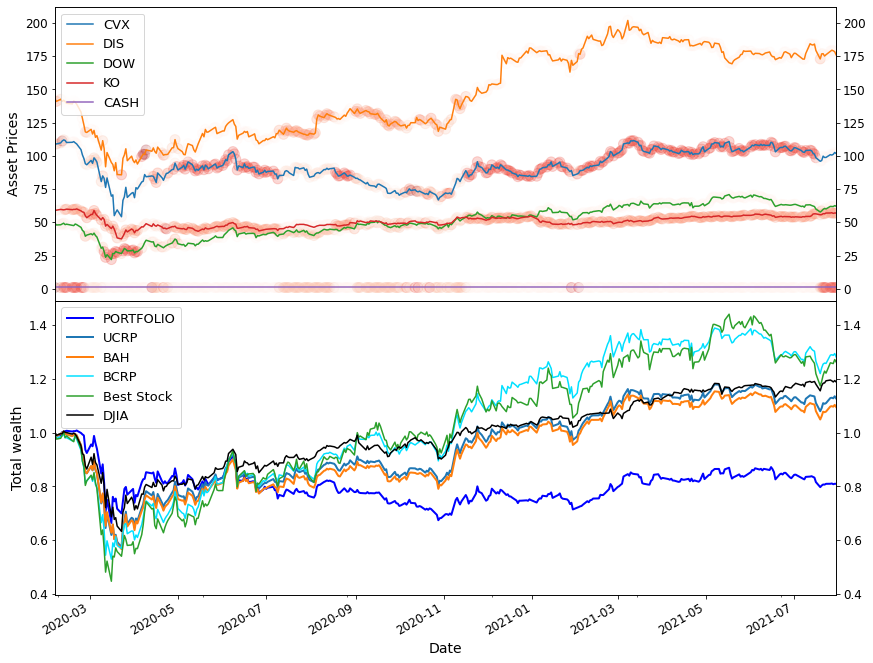

5 HON, WMT, HD, WBA
[*********************100%***********************]  4 of 4 completed
Total wealth: 0.981

    Profit factor: 0.99
    Sharpe ratio: 0.10 ± 0.82
    Ulcer index: 0.29
    Information ratio (wrt UCRP): -0.95
    Appraisal ratio (CAPM): -1.39 ± 0.83
    Appraisal ratio (wrt UCRP): -0.78 ± 0.82
    UCRP sharpe: 0.65 ± 0.90
    Beta / Alpha: 0.84 / -12.532%
    Annualized return: 2.80%
    Annualized volatility: 28.74%
    Longest drawdown: 227 days
    Max drawdown: 23.56%
    Winning days: 52.9%
    Annual turnover: 69.5
        
Final Holdings: [0.125 0.375 0.25  0.    0.25 ]


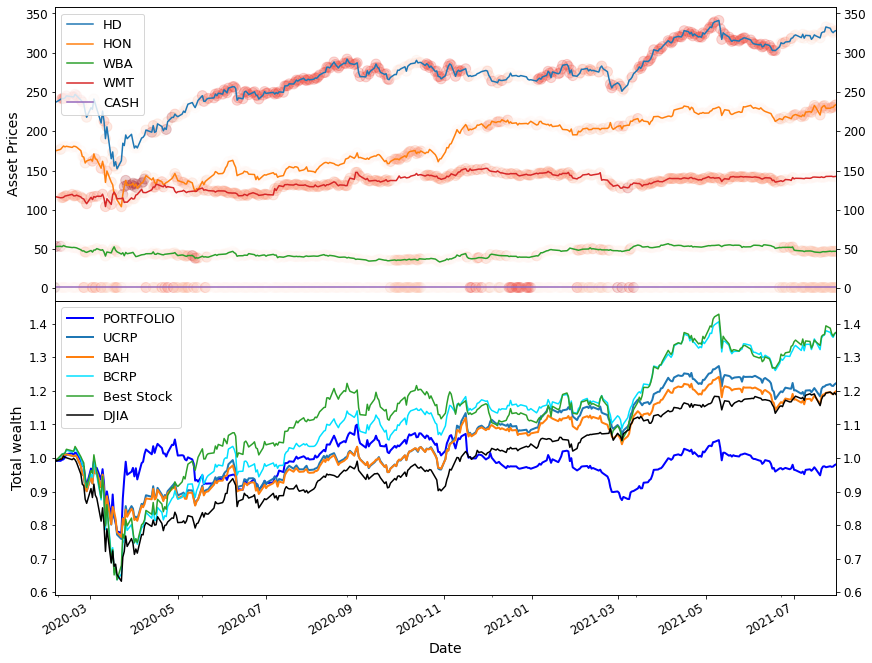

6 MRK, INTC, V, MSFT
[*********************100%***********************]  4 of 4 completed
Total wealth: 0.8199

    Profit factor: 0.92
    Sharpe ratio: -0.23 ± 0.83
    Ulcer index: -0.47
    Information ratio (wrt UCRP): -1.51
    Appraisal ratio (CAPM): -1.23 ± 0.84
    Appraisal ratio (wrt UCRP): -1.46 ± 0.82
    UCRP sharpe: 0.42 ± 0.86
    Beta / Alpha: 0.97 / -20.464%
    Annualized return: -7.65%
    Annualized volatility: 33.99%
    Longest drawdown: 370 days
    Max drawdown: 26.65%
    Winning days: 50.3%
    Annual turnover: 52.1
        
Final Holdings: [0.125 0.375 0.25  0.    0.25 ]


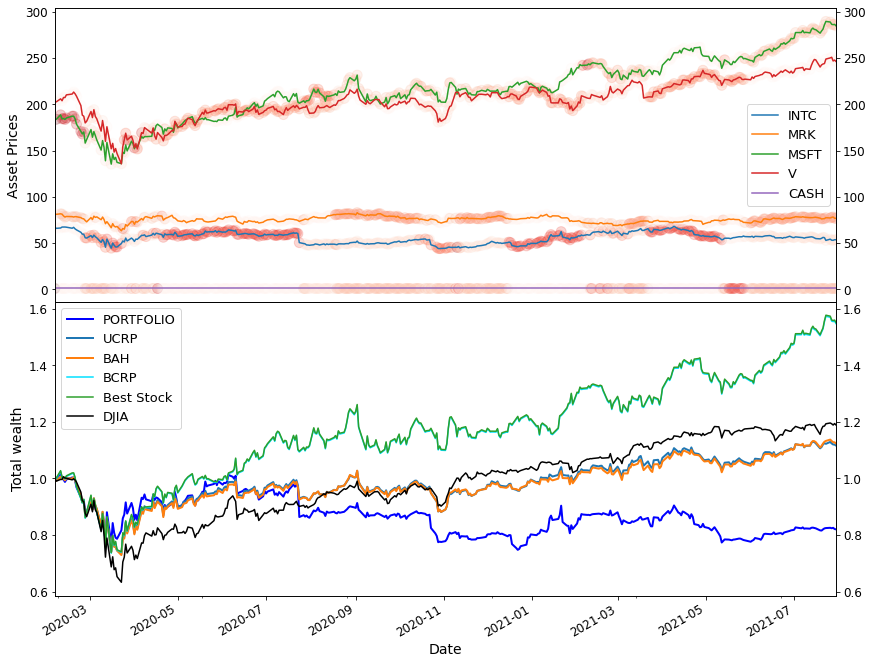

7 AMGN, MCD, GS, MRK
[*********************100%***********************]  4 of 4 completed
Total wealth: 0.8656

    Profit factor: 0.94
    Sharpe ratio: -0.11 ± 0.82
    Ulcer index: -0.23
    Information ratio (wrt UCRP): -1.18
    Appraisal ratio (CAPM): -1.25 ± 0.83
    Appraisal ratio (wrt UCRP): -1.24 ± 0.82
    UCRP sharpe: 0.55 ± 0.88
    Beta / Alpha: 1.08 / -20.475%
    Annualized return: -3.68%
    Annualized volatility: 34.95%
    Longest drawdown: 372 days
    Max drawdown: 34.35%
    Winning days: 49.5%
    Annual turnover: 24.9
        
Final Holdings: [0.625 0.    0.    0.375 0.   ]


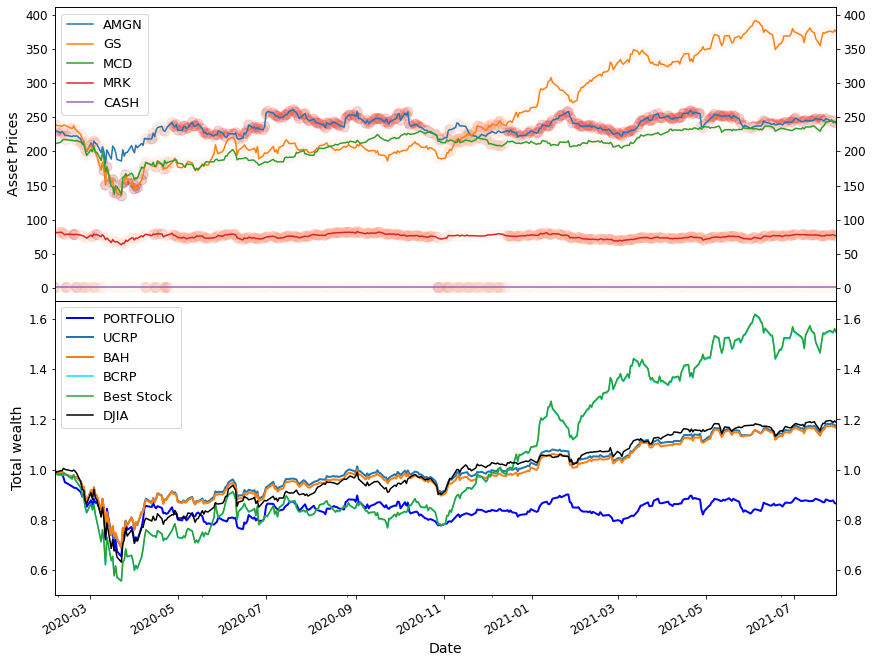

8 JNJ, NKE, CAT, TRV
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.2661

    Profit factor: 1.09
    Sharpe ratio: 0.64 ± 0.90
    Ulcer index: 1.93
    Information ratio (wrt UCRP): -0.29
    Appraisal ratio (CAPM): -0.38 ± 0.83
    Appraisal ratio (wrt UCRP): -0.38 ± 0.82
    UCRP sharpe: 0.87 ± 0.97
    Beta / Alpha: 1.06 / -5.422%
    Annualized return: 21.99%
    Annualized volatility: 34.57%
    Longest drawdown: 169 days
    Max drawdown: 35.04%
    Winning days: 54.0%
    Annual turnover: 40.5
        
Final Holdings: [0.375 0.5   0.    0.125 0.   ]


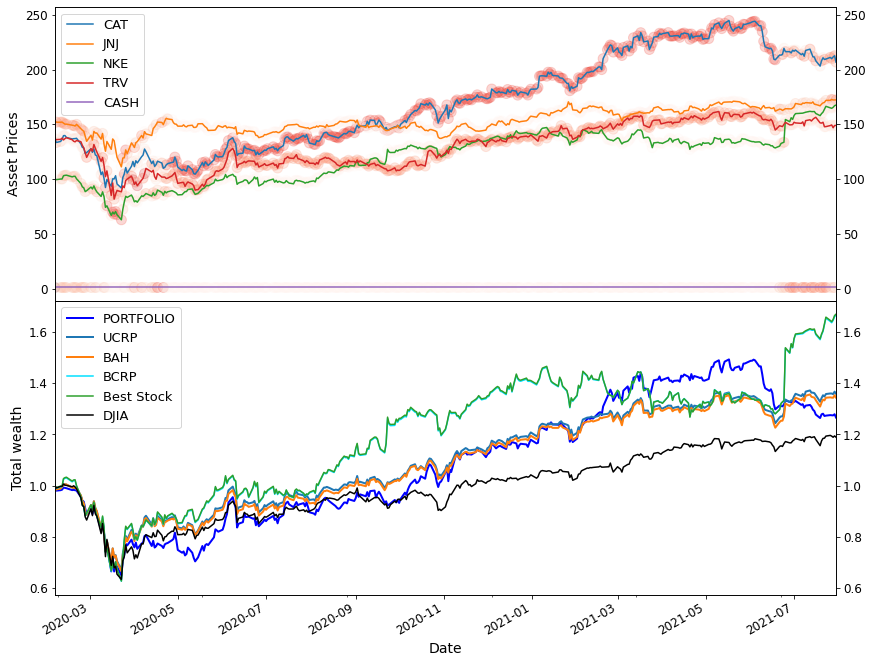

9 AMGN, IBM, VZ, CSCO
[*********************100%***********************]  4 of 4 completed
Total wealth: 0.9923

    Profit factor: 1.00
    Sharpe ratio: 0.12 ± 0.83
    Ulcer index: 0.43
    Information ratio (wrt UCRP): -0.15
    Appraisal ratio (CAPM): -0.27 ± 0.83
    Appraisal ratio (wrt UCRP): -0.11 ± 0.82
    UCRP sharpe: 0.20 ± 0.83
    Beta / Alpha: 0.94 / -1.371%
    Annualized return: 3.41%
    Annualized volatility: 28.17%
    Longest drawdown: 259 days
    Max drawdown: 22.88%
    Winning days: 47.3%
    Annual turnover: 43.3
        
Final Holdings: [0.625 0.    0.    0.375 0.   ]


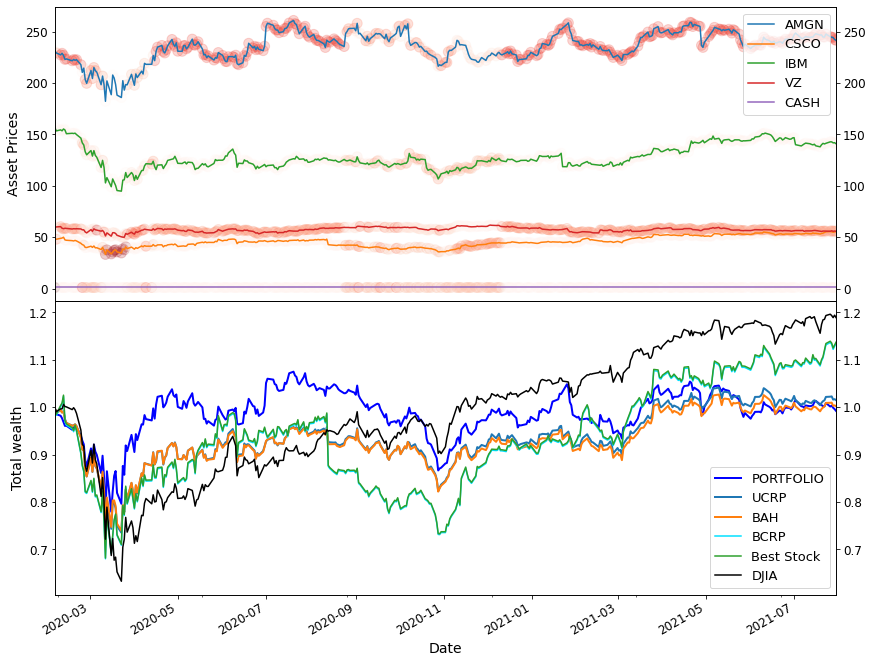

10 DIS, IBM, WMT, AMGN
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.0749

    Profit factor: 1.04
    Sharpe ratio: 0.31 ± 0.84
    Ulcer index: 1.20
    Information ratio (wrt UCRP): -0.17
    Appraisal ratio (CAPM): -0.17 ± 0.83
    Appraisal ratio (wrt UCRP): -0.08 ± 0.82
    UCRP sharpe: 0.45 ± 0.86
    Beta / Alpha: 0.88 / -1.404%
    Annualized return: 9.12%
    Annualized volatility: 29.25%
    Longest drawdown: 227 days
    Max drawdown: 23.12%
    Winning days: 50.3%
    Annual turnover: 33.1
        
Final Holdings: [0.625 0.    0.    0.375 0.   ]


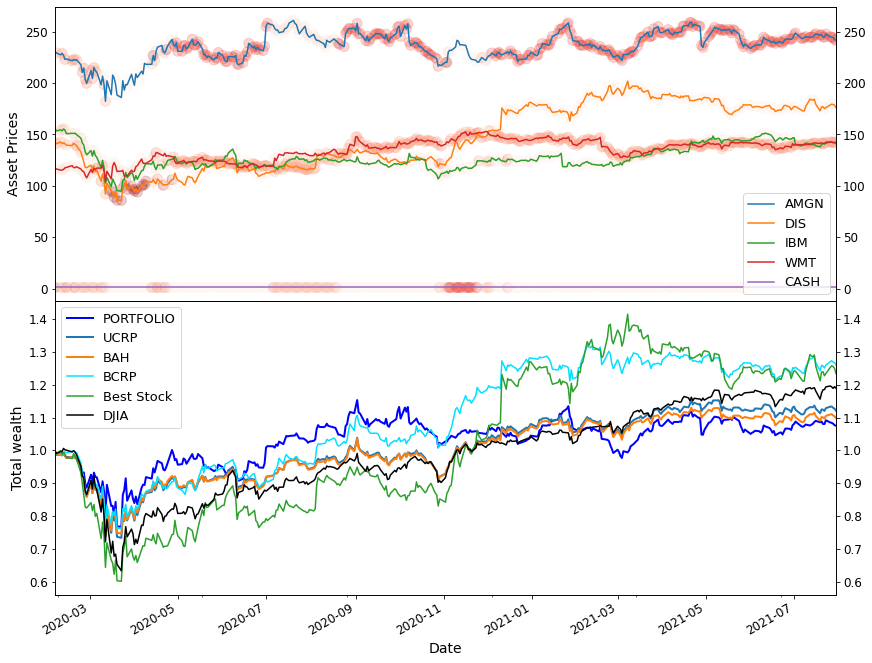

In [25]:
# for each model
for model, agent in agents:
    print(model)
    
    # query 10 random 4-asset portfolios without replacement
    for i in range(10):
        tickers = np.random.choice(config.DOW_TICKERS, 4, replace=False)
        print(i+1, ', '.join(tickers))

        # set start to beginning of test period
        start = test.index[0]
        # query prices for selected assets
        new_test = download_ticker_data(','.join(tickers), start=start, end=config.END, columns=['Open', 'High', 'Low', 'Close']).dropna()

        # setup test environment
        test_env = PortfolioEnv(
            tickers=tickers,
            prices=new_test, 
            market_prices=market_test,
            window_length=config.WINDOW_LENGTH,
            trading_cost=config.COMMISSION_RATE,
            action_space_type=config.ACTION_SPACE[model],
            render_mode='test'
        )
        
        # evaluate agent on test environment
        evalu8(agent, test_env)

### Learning Capacity
Ability for learning to trade various portfolios with the same hyperparameters.

In [26]:
# map portfolios to the model path
params = [
    # DQN
    (['KO', 'AXP', 'DIS', 'CVX'], 'models/variants/DQN_A.zip'),
    (['WMT', 'MMM', 'MCD', 'JNJ'], 'models/variants/DQN_B.zip'),
    (['CSCO', 'HD', 'CAT', 'IBM'], 'models/variants/DQN_C.zip'),
    # DDPG
    (['WMT', 'MMM', 'MCD', 'JNJ'], 'models/variants/DDPG_A.zip'),
    (['UNH', 'AMGN', 'NKE', 'VZ'], 'models/variants/DDPG_B.zip'),
    (['PG', 'NKE', 'GS', 'UNH'], 'models/variants/DDPG_C.zip'),
]

dqn KO, AXP, DIS, CVX
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.2594

    Profit factor: 1.07
    Sharpe ratio: 0.57 ± 0.89
    Ulcer index: 1.58
    Information ratio (wrt UCRP): 0.71
    Appraisal ratio (CAPM): 0.31 ± 0.83
    Appraisal ratio (wrt UCRP): 0.64 ± 0.82
    UCRP sharpe: 0.42 ± 0.86
    Beta / Alpha: 1.07 / 7.750%
    Annualized return: 25.25%
    Annualized volatility: 44.18%
    Longest drawdown: 198 days
    Max drawdown: 46.62%
    Winning days: 49.5%
    Annual turnover: 15.8
        
Final Holdings: [0.375 0.    0.625 0.    0.   ]


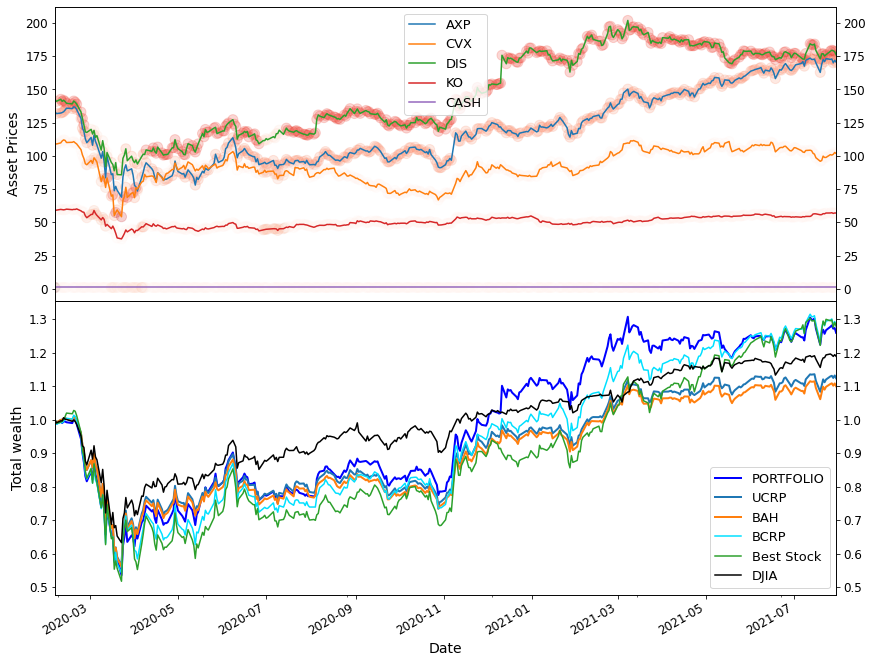

dqn WMT, MMM, MCD, JNJ
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.3531

    Profit factor: 1.19
    Sharpe ratio: 1.01 ± 1.01
    Ulcer index: 4.95
    Information ratio (wrt UCRP): 0.74
    Appraisal ratio (CAPM): 1.45 ± 0.83
    Appraisal ratio (wrt UCRP): 1.03 ± 0.82
    UCRP sharpe: 0.64 ± 0.90
    Beta / Alpha: 0.86 / 9.947%
    Annualized return: 23.05%
    Annualized volatility: 22.82%
    Longest drawdown: 72 days
    Max drawdown: 19.95%
    Winning days: 54.5%
    Annual turnover: 11.3
        
Final Holdings: [0.    0.875 0.125 0.    0.   ]


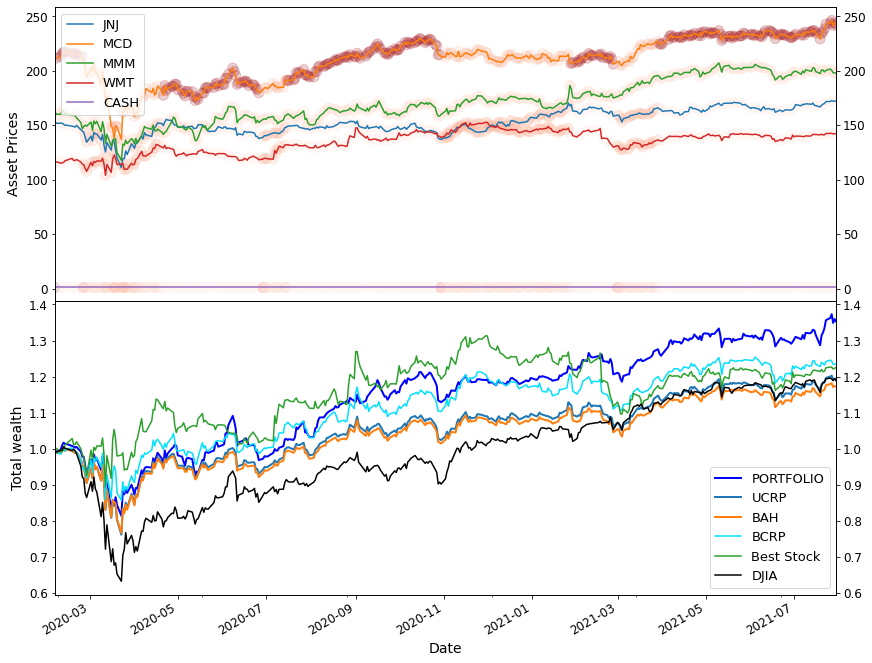

dqn CSCO, HD, CAT, IBM
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.5193

    Profit factor: 1.17
    Sharpe ratio: 1.03 ± 1.02
    Ulcer index: 4.54
    Information ratio (wrt UCRP): 1.08
    Appraisal ratio (CAPM): 1.91 ± 0.84
    Appraisal ratio (wrt UCRP): 1.17 ± 0.82
    UCRP sharpe: 0.62 ± 0.90
    Beta / Alpha: 0.95 / 15.184%
    Annualized return: 33.72%
    Annualized volatility: 32.89%
    Longest drawdown: 60 days
    Max drawdown: 30.57%
    Winning days: 52.7%
    Annual turnover: 18.8
        
Final Holdings: [0.625 0.    0.    0.375 0.   ]


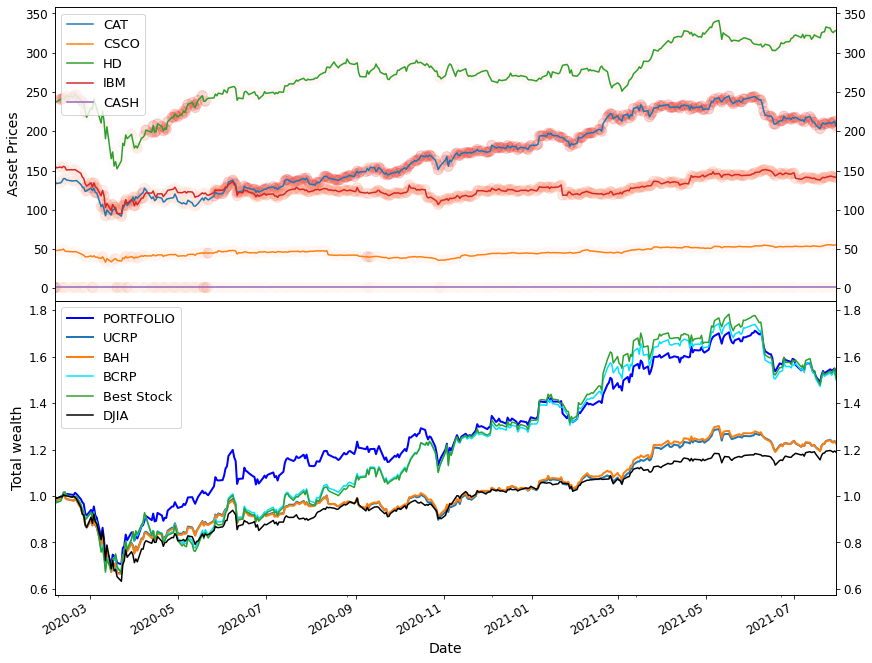

dqn WMT, MMM, MCD, JNJ
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.1759

    Profit factor: 1.11
    Sharpe ratio: 0.60 ± 0.89
    Ulcer index: 3.24
    Information ratio (wrt UCRP): -0.43
    Appraisal ratio (CAPM): -1.53 ± 0.83
    Appraisal ratio (wrt UCRP): -0.14 ± 0.82
    UCRP sharpe: 0.64 ± 0.90
    Beta / Alpha: 0.92 / -0.602%
    Annualized return: 13.51%
    Annualized volatility: 22.66%
    Longest drawdown: 101 days
    Max drawdown: 21.80%
    Winning days: 55.6%
    Annual turnover: 2.4
        
Final Holdings: [0.296 0.296 0.057 0.296 0.054]


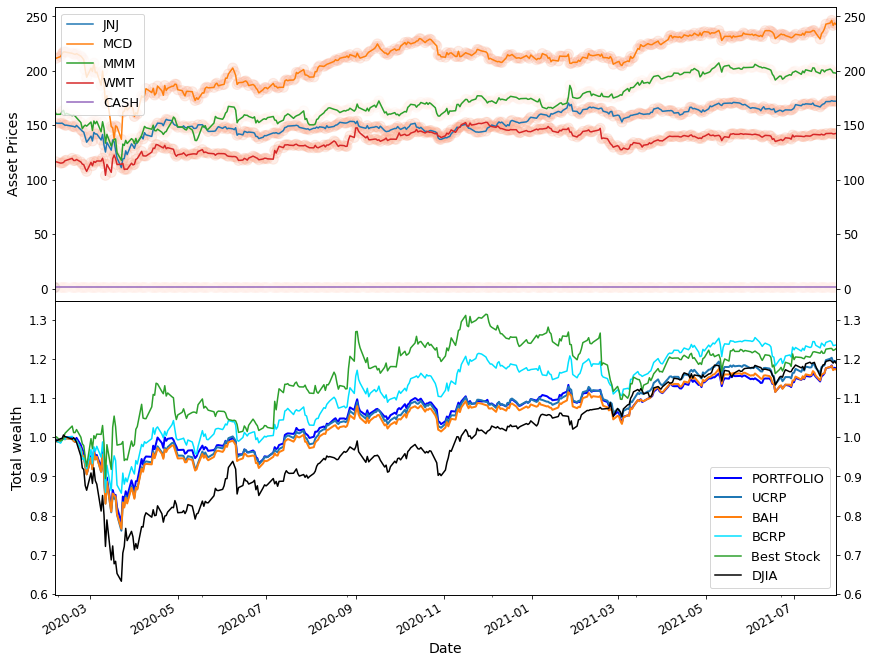

ddpg UNH, AMGN, NKE, VZ
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.3094

    Profit factor: 1.13
    Sharpe ratio: 0.76 ± 0.93
    Ulcer index: 3.92
    Information ratio (wrt UCRP): 0.34
    Appraisal ratio (CAPM): -0.70 ± 0.83
    Appraisal ratio (wrt UCRP): 0.21 ± 0.82
    UCRP sharpe: 0.73 ± 0.93
    Beta / Alpha: 1.06 / 1.677%
    Annualized return: 22.71%
    Annualized volatility: 30.02%
    Longest drawdown: 74 days
    Max drawdown: 28.80%
    Winning days: 52.7%
    Annual turnover: 9.4
        
Final Holdings: [0.339 0.339 0.322 0.    0.   ]


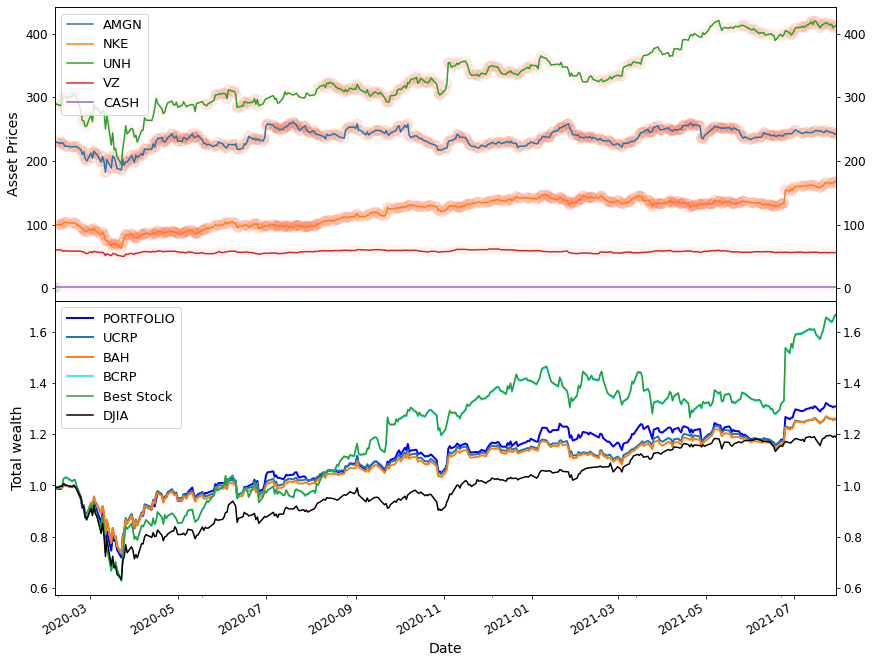

ddpg PG, NKE, GS, UNH
[*********************100%***********************]  4 of 4 completed
Total wealth: 1.4962

    Profit factor: 1.19
    Sharpe ratio: 1.02 ± 1.01
    Ulcer index: 4.41
    Information ratio (wrt UCRP): 0.06
    Appraisal ratio (CAPM): -0.05 ± 0.83
    Appraisal ratio (wrt UCRP): 0.32 ± 0.82
    UCRP sharpe: 0.99 ± 1.00
    Beta / Alpha: 0.89 / 4.658%
    Annualized return: 32.18%
    Annualized volatility: 31.50%
    Longest drawdown: 118 days
    Max drawdown: 34.04%
    Winning days: 52.4%
    Annual turnover: 9.1
        
Final Holdings: [0.    0.794 0.178 0.    0.028]


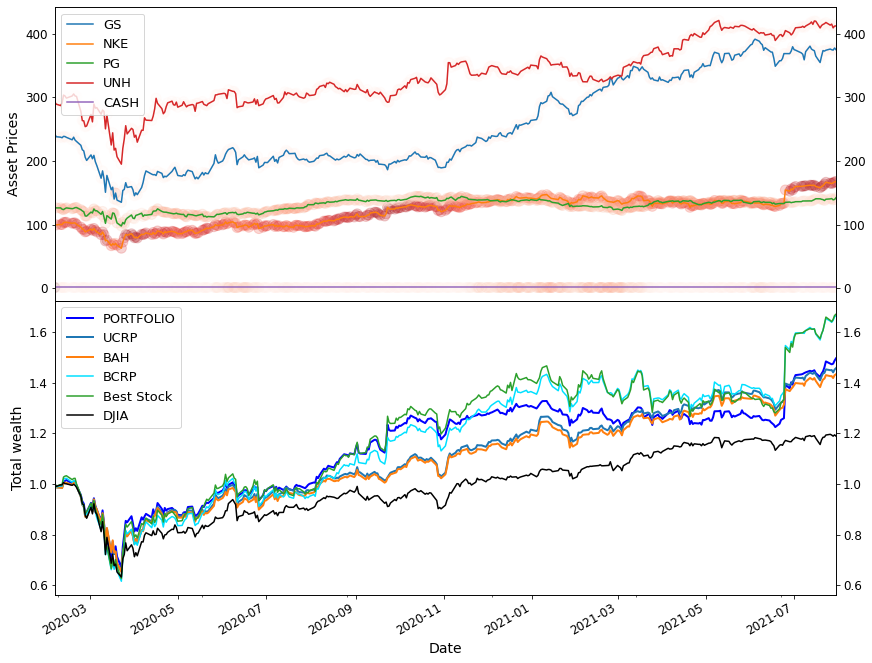

In [27]:
# for each model
for tickers, path in params:
    print(model,  ', '.join(tickers))

    # load agent
    model, agent = load_model(path)
    
    # set start to beginning of test period
    start = test.index[0]
    # query prices for selected assets
    new_test = download_ticker_data(tickers, start=start, end=config.END, columns=['Open', 'High', 'Low', 'Close']).dropna()

    # setup test environment
    test_env = PortfolioEnv(
        tickers=tickers,
        prices=new_test, 
        market_prices=market_test,
        window_length=config.WINDOW_LENGTH,
        trading_cost=config.COMMISSION_RATE,
        action_space_type=config.ACTION_SPACE[model],
        render_mode='test'
    )

    # evaluate agent on test environment
    evalu8(agent, test_env)